2024-03-04 12:25:00.775024: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1


Start loading raw data.
Finish loading raw data.
Start filtering low-quality cells and SNPs.


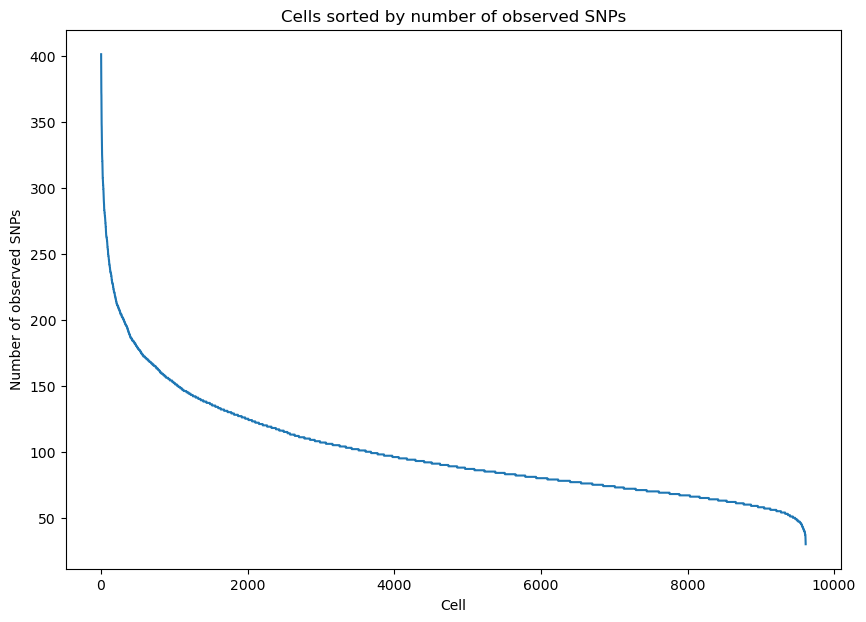

Please determine y-axis threshold in the plot to filter low-quality cells with low number of observed SNPs.   50


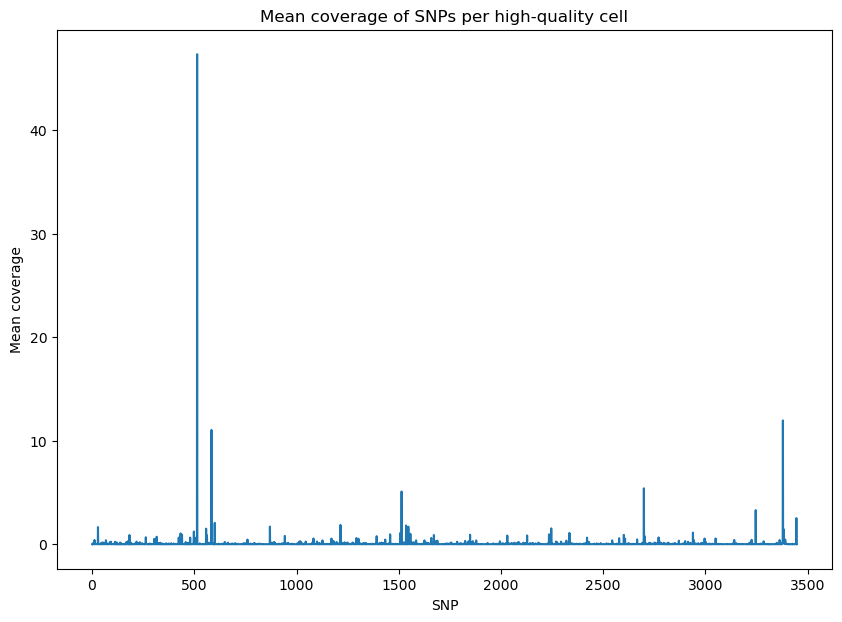

Please determine y-axis threshold in the plot to filter low-quality SNPs with low coverage.   0


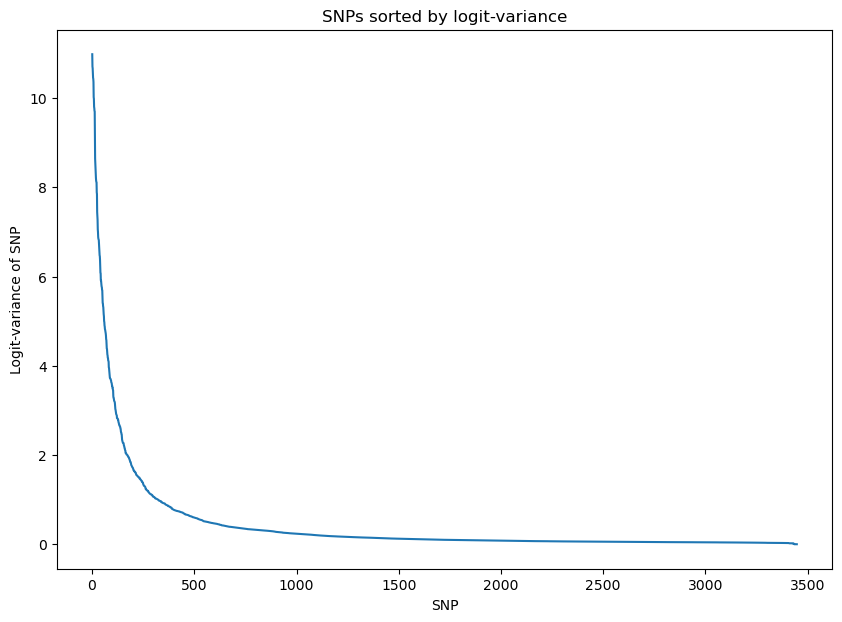

Please determine y-axis threshold in the plot to filter low-quality SNPs with low logit-variance.   0.3
Finish filtering low-quality data, 9436 cells and 864 SNPs will be used for downstream analysis.
Start training VAE.
Epoch[10/2000], Cost: 1.099402
Epoch[20/2000], Cost: 0.912296
Epoch[30/2000], Cost: 0.804384
Epoch[40/2000], Cost: 0.729939
Epoch[50/2000], Cost: 0.674925
Epoch[60/2000], Cost: 0.632524
Epoch[70/2000], Cost: 0.598284
Epoch[80/2000], Cost: 0.570535
Epoch[90/2000], Cost: 0.547468
Epoch[100/2000], Cost: 0.527210
Epoch[110/2000], Cost: 0.509674
Epoch[120/2000], Cost: 0.494122
Epoch[130/2000], Cost: 0.480231
Epoch[140/2000], Cost: 0.467804
Epoch[150/2000], Cost: 0.456725
Epoch[160/2000], Cost: 0.446637
Epoch[170/2000], Cost: 0.437639
Epoch[180/2000], Cost: 0.429460
Epoch[190/2000], Cost: 0.422053
Epoch[200/2000], Cost: 0.415458
Epoch[210/2000], Cost: 0.409241
Epoch[220/2000], Cost: 0.403731
Epoch[230/2000], Cost: 0.398588
Epoch[240/2000], Cost: 0.394018
Epoch[250/2000], Cos

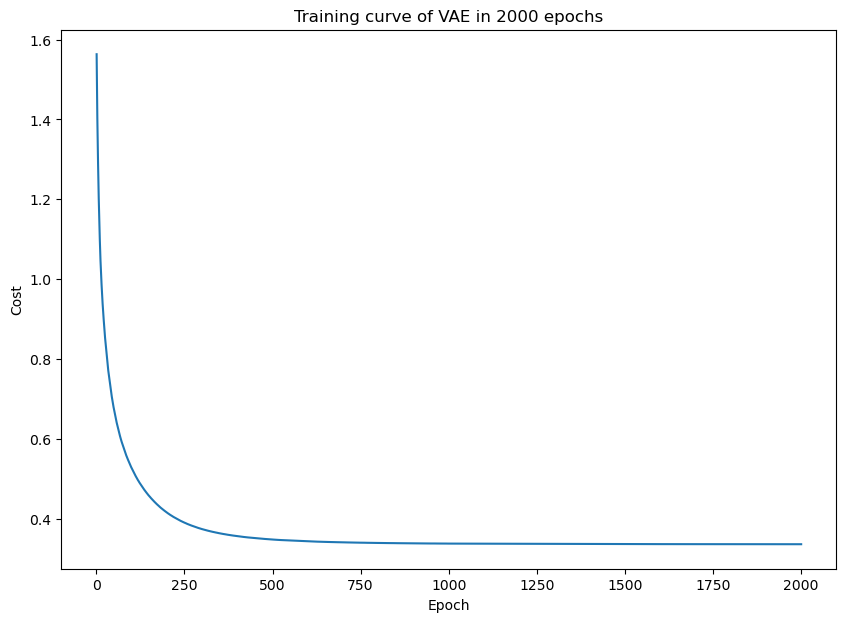

Start learning PCA and UMAP of latent space in VAE.
Finish learning, PCA and UMAP of latent space will be shown below.


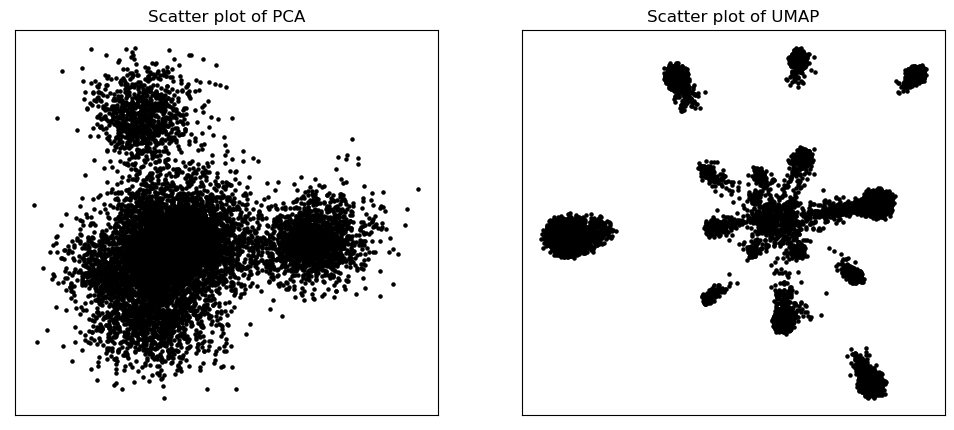

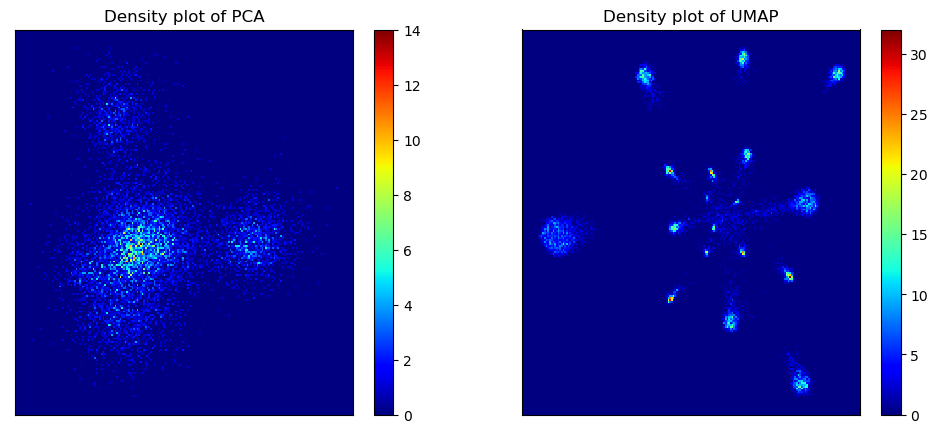

Start clustering.
Finish clustering.
PCA and UMAP of individual clusters will be shown below.


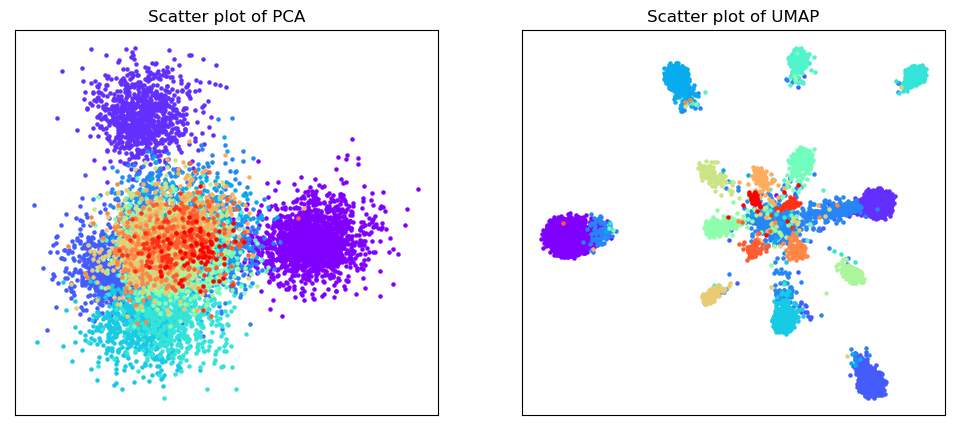

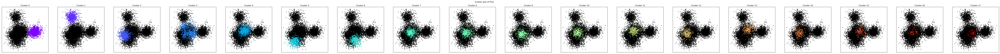

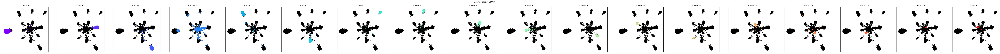

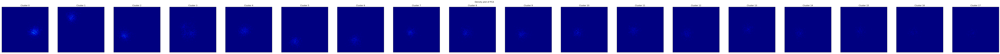

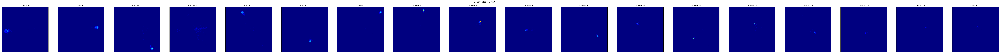

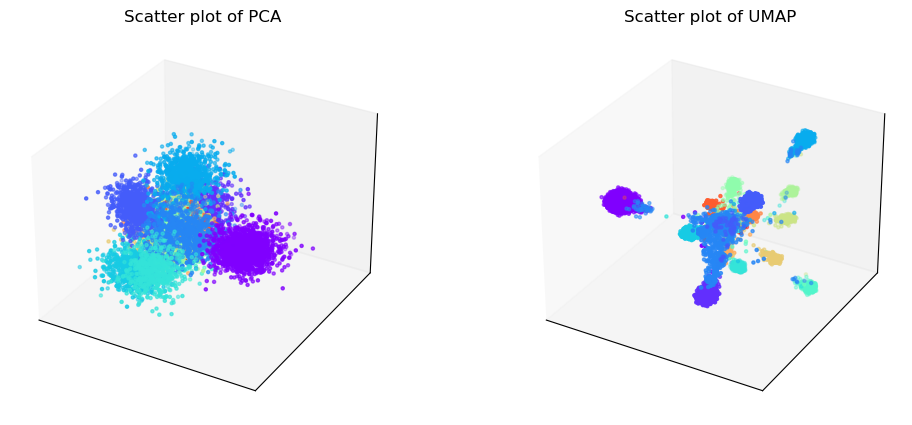

Phylogenetic tree in latent space will be shown below.


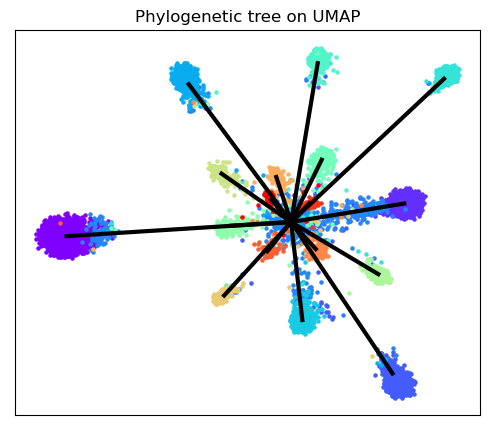

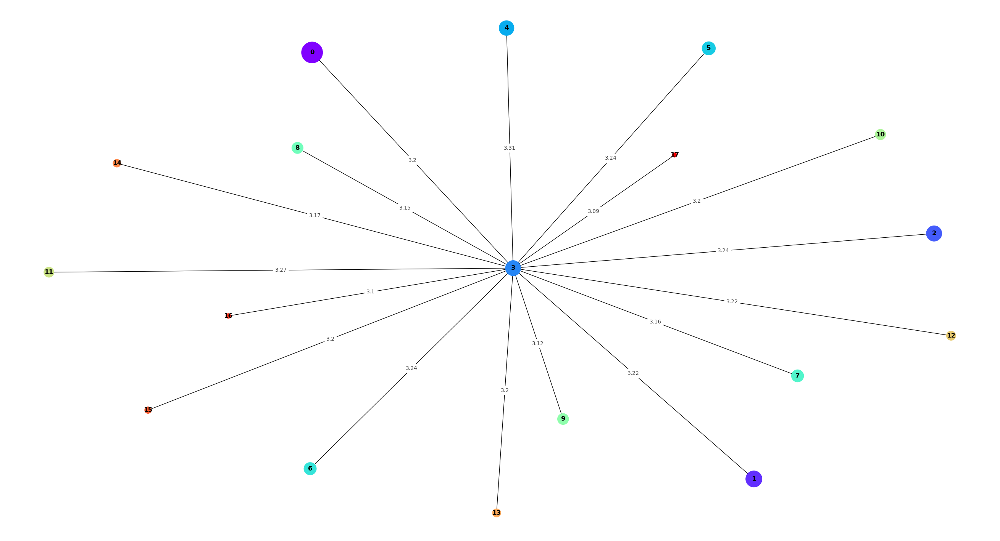

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:261: RuntimeWarning: divide by zero encountered in true_divide


SNP-allelic ratios of 9436 cells and 50 SNPs will be shown below.


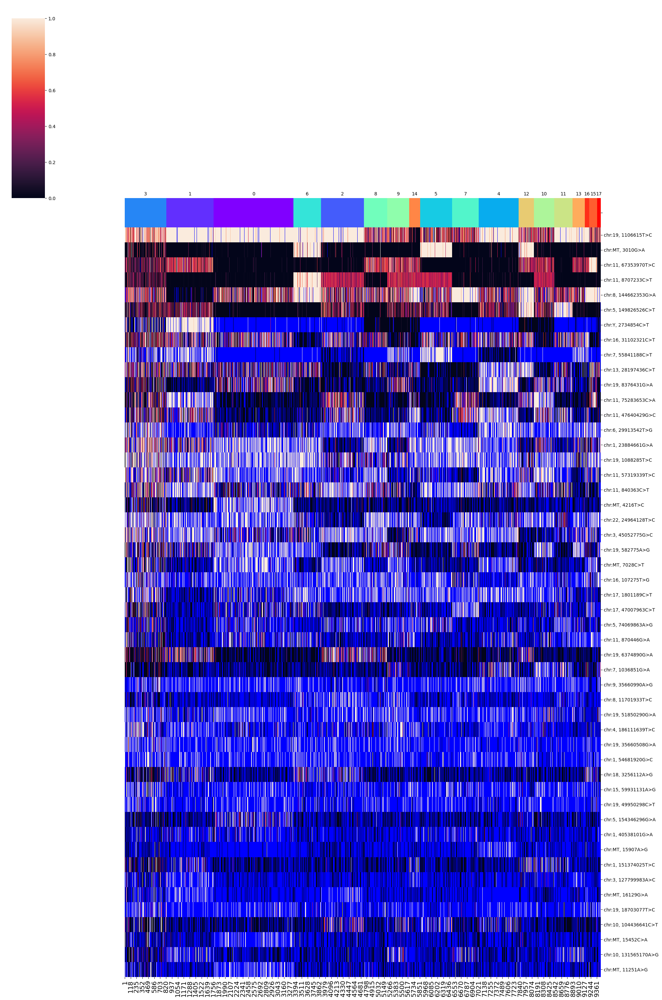

SNPs sorted by lowest p-value will be shown below


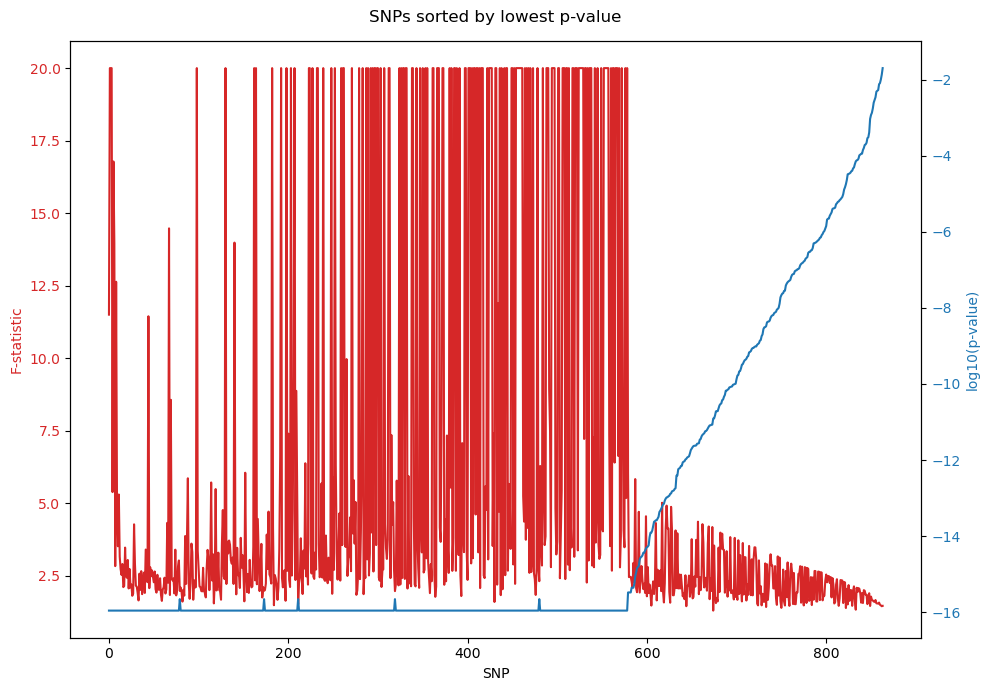

In [1]:
%run /home/u3570318/mount2/figures_final2/notebook2/SNPmanifold.ipynb
test1 = SNP_VAE(path = "/home/u3570318/mount2/figures_final2/data/neuronDiff")
test1.filtering()
test1.training()
test1.clustering(algorithm = "leiden_full")
test1.phylogeny()

Finish filtering low-quality data, 9436 cells and 864 SNPs will be used for downstream analysis.


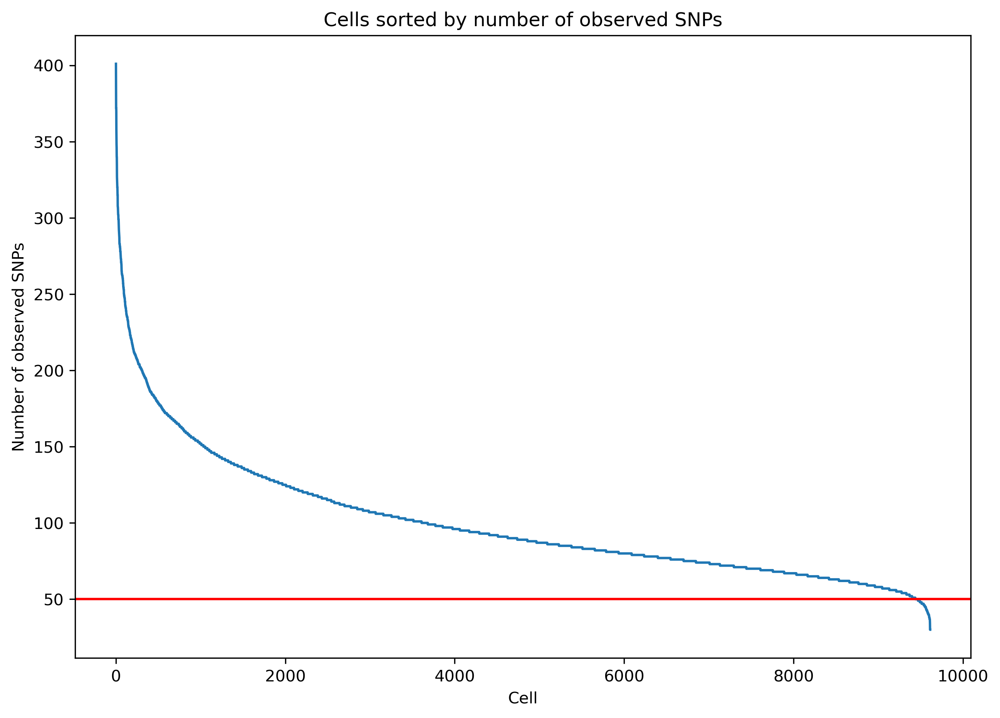

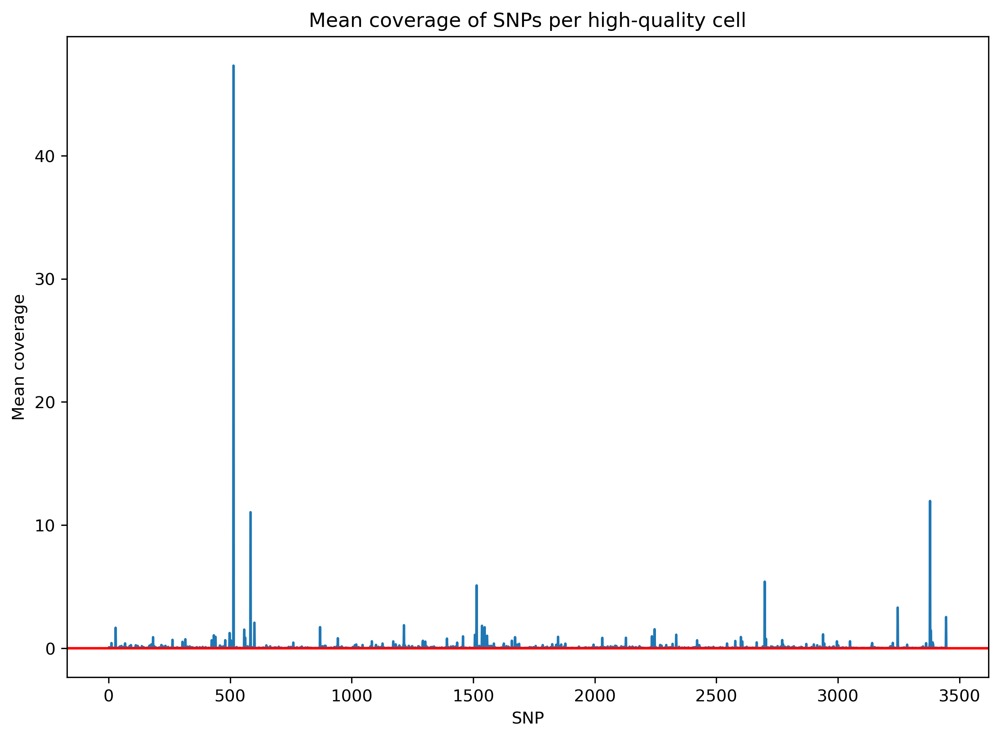

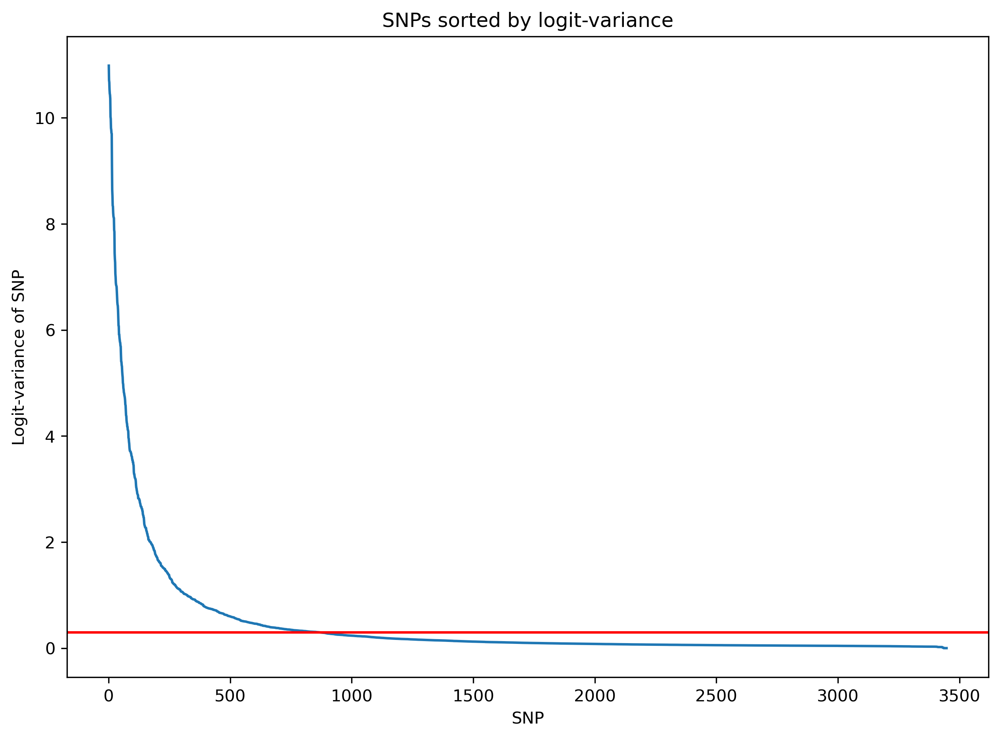

Training curve will be shown below.


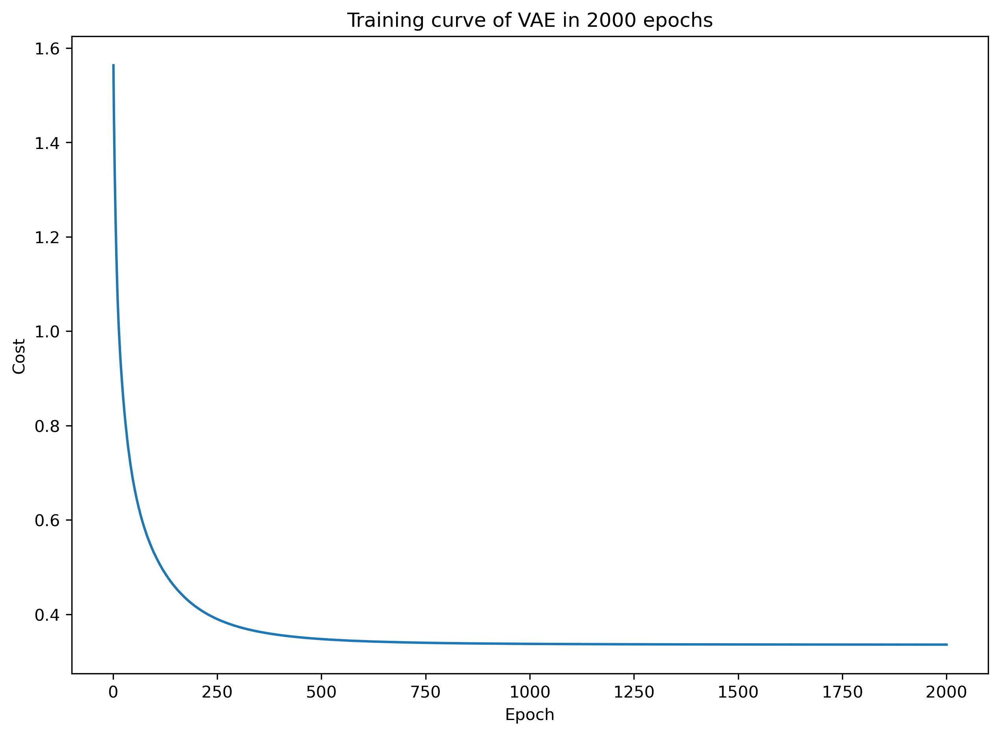

PCA and UMAP of latent space will be shown below.


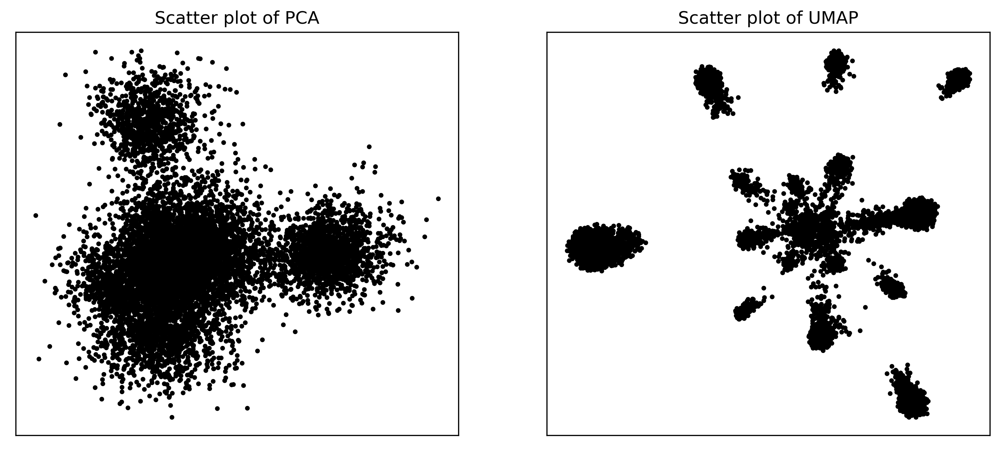

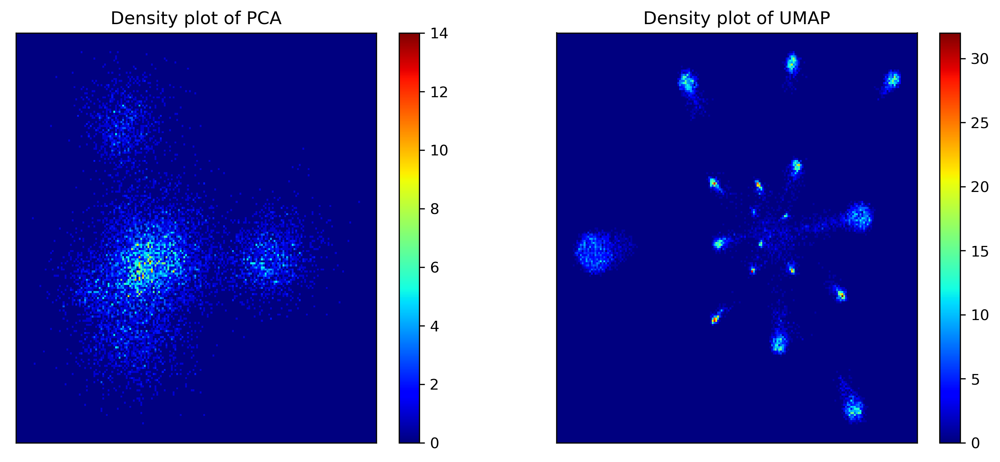

Nothing to be shown.
PCA and UMAP of individual clusters will be shown below.


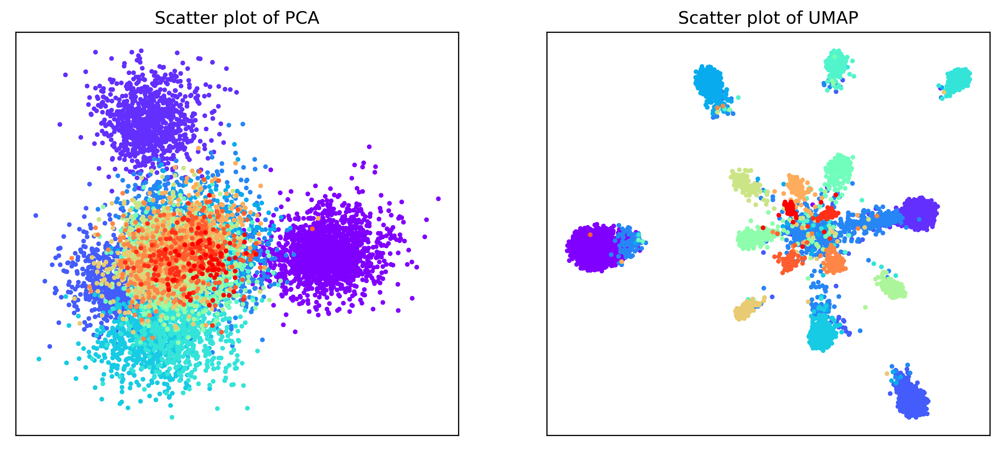

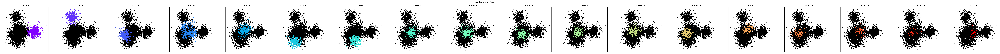

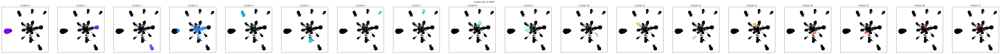

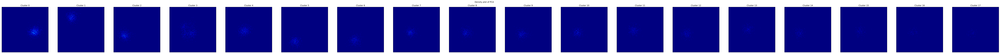

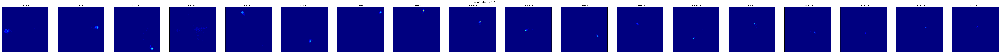

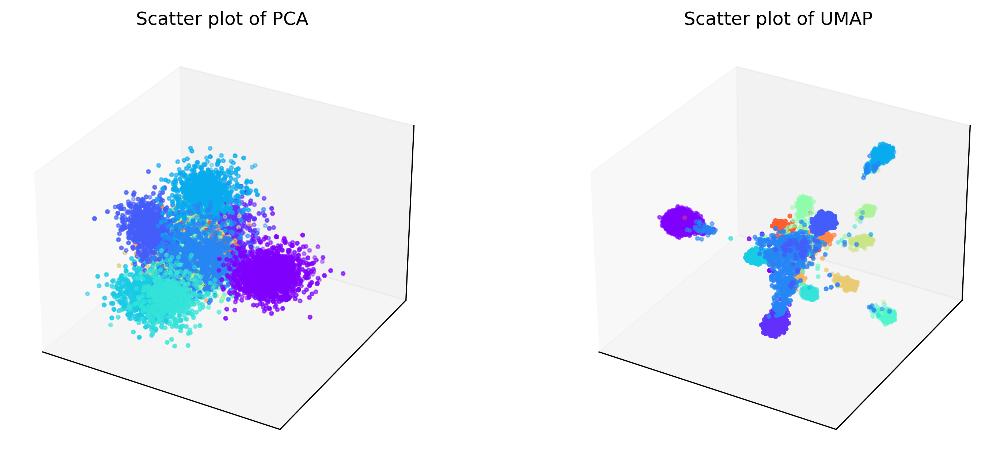

Phylogenetic tree in latent space will be shown below.


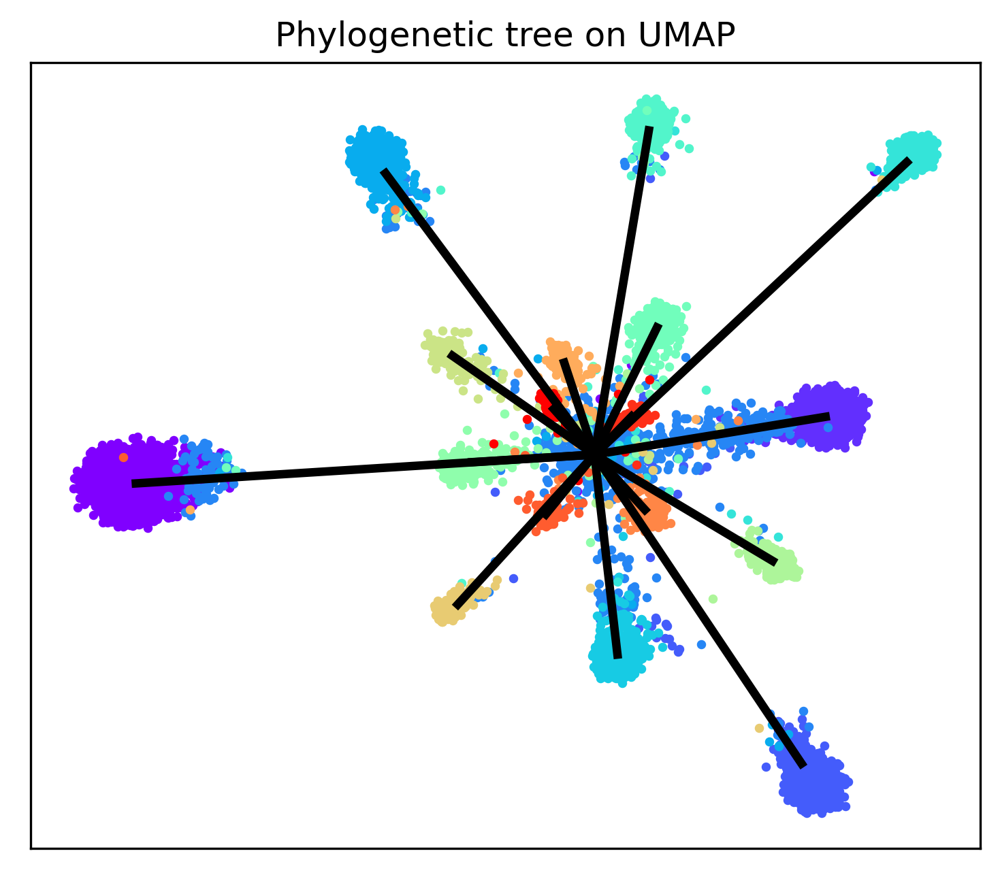

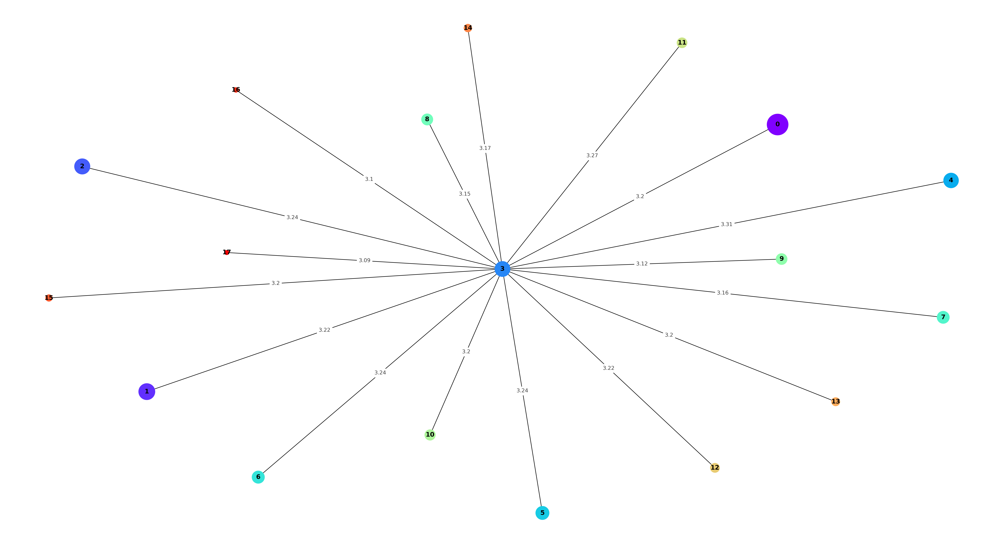

SNP-allelic ratios of 9436 cells and 30 SNPs will be shown below.


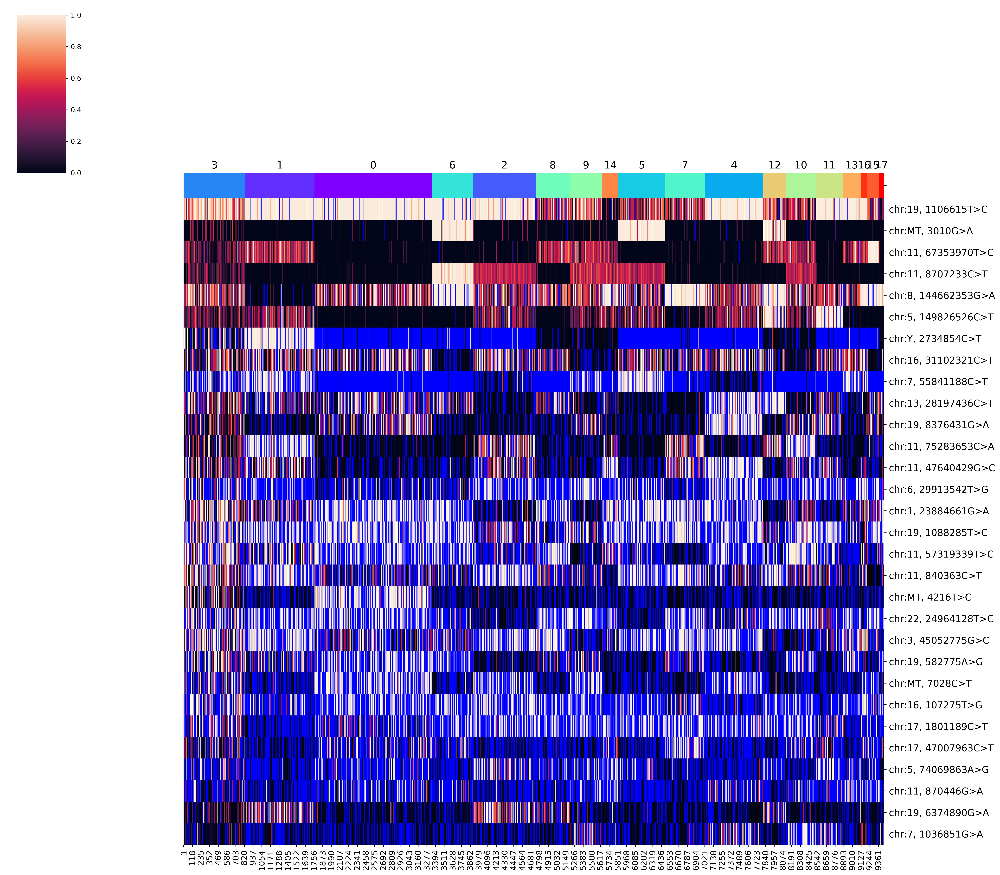

SNPs sorted by lowest p-value will be shown below


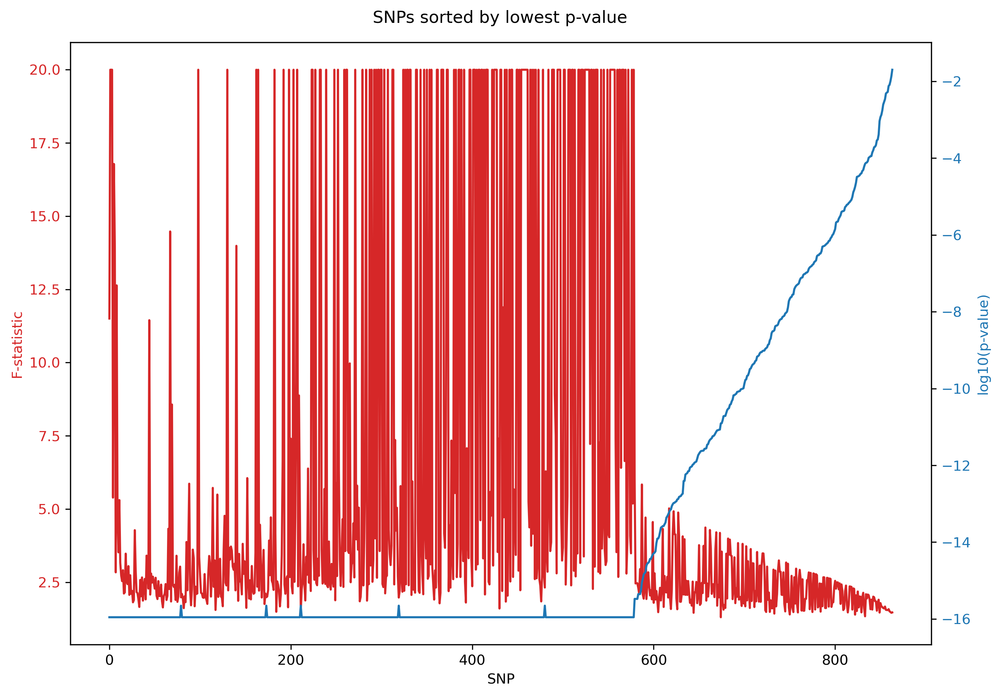

In [2]:
test1.filtering_summary(dpi = 300)
test1.training_summary(dpi = 300)
test1.clustering_summary(dpi = 300)
test1.phylogeny_summary(dpi = 300, SNP_no = 30, fontsize_y = 14, fontsize_x = 12, fontsize_c = 15)

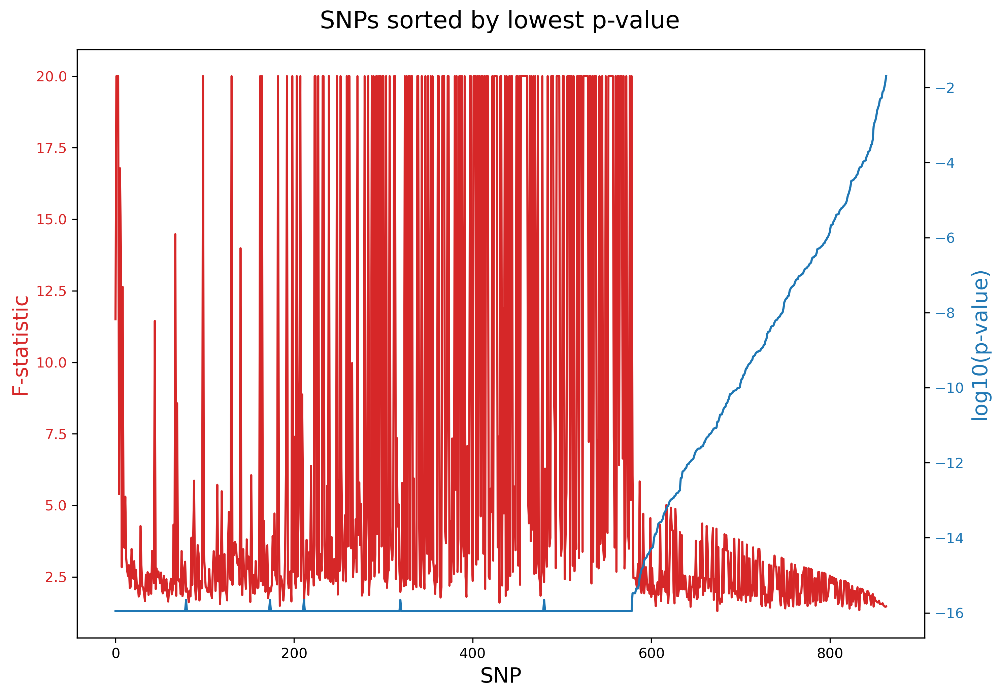

In [3]:
fig, ax1 = plt.subplots(dpi = 300)
fig.set_size_inches(10, 7)
fig.suptitle("SNPs sorted by lowest p-value", fontsize = 17)

ax1.set_xlabel('SNP', fontsize = 15)
ax1.set_ylabel('F-statistic', color = 'tab:red', fontsize = 15)
ax1.plot(np.arange(test1.SNP_total), test1.f_stat_ranked, color = 'tab:red')
ax1.tick_params(axis = 'y', labelcolor = 'tab:red')

ax2 = ax1.twinx()

color = 'tab:blue'
ax2.set_ylabel('log10(p-value)', color = 'tab:blue', fontsize = 15)
ax2.plot(np.arange(test1.SNP_total), np.log10(test1.p_value_ranked), color = 'tab:blue')
ax2.tick_params(axis = 'y', labelcolor = 'tab:blue')

fig.tight_layout()
plt.show()

In [4]:
tsv_souporcell = pd.read_csv('/home/u3570318/mount2/figures_final2/data/neuronDiff/clusters_souporcell.tsv', sep='\t')
tsv_souporcell

,barcode,status,assignment,log_prob_singleton,log_prob_doublet,cluster0,cluster1,cluster2,cluster3,cluster4,...,cluster8,cluster9,cluster10,cluster11,cluster12,cluster13,cluster14,cluster15,cluster16,cluster17
0,AAACCTGAGGGTATCG-1,singlet,0,-141.754287,-169.905328,-141.754287,-320.488355,-294.640768,-336.281423,-271.842135,...,-327.376567,-297.562335,-210.668186,-289.028438,-285.016324,-320.580071,-305.805509,-309.228941,-228.958386,-290.189784
1,AAACCTGAGGTGTTAA-1,singlet,14,-277.487704,-313.956031,-664.110280,-670.317115,-630.149974,-662.610323,-595.105912,...,-713.628097,-724.328354,-531.584580,-694.151392,-664.695838,-661.231032,-277.487704,-625.307705,-531.405177,-619.745942
2,AAACCTGAGTGGGCTA-1,singlet,1,-312.434878,-407.284514,-646.329871,-312.434878,-657.121812,-603.053938,-551.615947,...,-590.811872,-620.116602,-483.071809,-676.653630,-613.071834,-680.117565,-658.731151,-582.537473,-498.503940,-580.792854
3,AAACCTGCAAACGCGA-1,singlet,0,-303.029543,-403.007730,-303.029543,-691.871348,-747.596198,-734.265935,-621.647169,...,-674.055931,-739.235833,-522.684523,-698.820716,-664.805442,-749.422074,-738.822053,-757.252776,-538.208003,-682.052003
4,AAACCTGCACATCTTT-1,singlet,10,-566.737106,-582.755307,-808.518336,-907.926415,-751.809046,-925.136827,-765.865207,...,-846.766042,-892.499216,-566.737106,-918.855591,-900.938975,-869.072730,-901.160590,-888.556902,-738.952388,-844.929427
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9607,TTTGTCAGTTCGCGAC-1,singlet,11,-271.996139,-359.625973,-527.996828,-579.343282,-648.979774,-538.174098,-500.447946,...,-554.581316,-575.834435,-424.279260,-271.996139,-507.526844,-592.971305,-559.393350,-572.826476,-444.364930,-584.807452
9608,TTTGTCATCAAGATCC-1,singlet,2,-312.554440,-400.172709,-722.740156,-799.973077,-312.554440,-774.752718,-678.620827,...,-751.141867,-788.009720,-559.355502,-707.322938,-704.683279,-735.371872,-752.385572,-781.702050,-592.468264,-734.212110
9609,TTTGTCATCGAACTGT-1,singlet,3,-328.180951,-364.159145,-706.223175,-718.137419,-681.404114,-328.180951,-671.554704,...,-669.102755,-697.918381,-521.653896,-686.444969,-688.293443,-703.419467,-713.291188,-675.472200,-458.808471,-656.791590
9610,TTTGTCATCGAATGGG-1,singlet,6,-233.773768,-291.747263,-475.171572,-525.074366,-564.862895,-520.356218,-475.901238,...,-512.659465,-547.526435,-398.502519,-517.235277,-485.854989,-581.068077,-575.946762,-517.216999,-418.901066,-502.571953


In [5]:
souporcell_prob = np.zeros((18, 9612))

for w in range(18):
 
    souporcell_prob[w, :] = tsv_souporcell["cluster" + str(w)].to_numpy()
    
df_souporcell = np.argmax(souporcell_prob, 0)

doublet_souporcell = tsv_souporcell["status"].to_numpy() == "doublet"

df_souporcell[doublet_souporcell] = 18

df_souporcell = df_souporcell[test1.cell_filter]

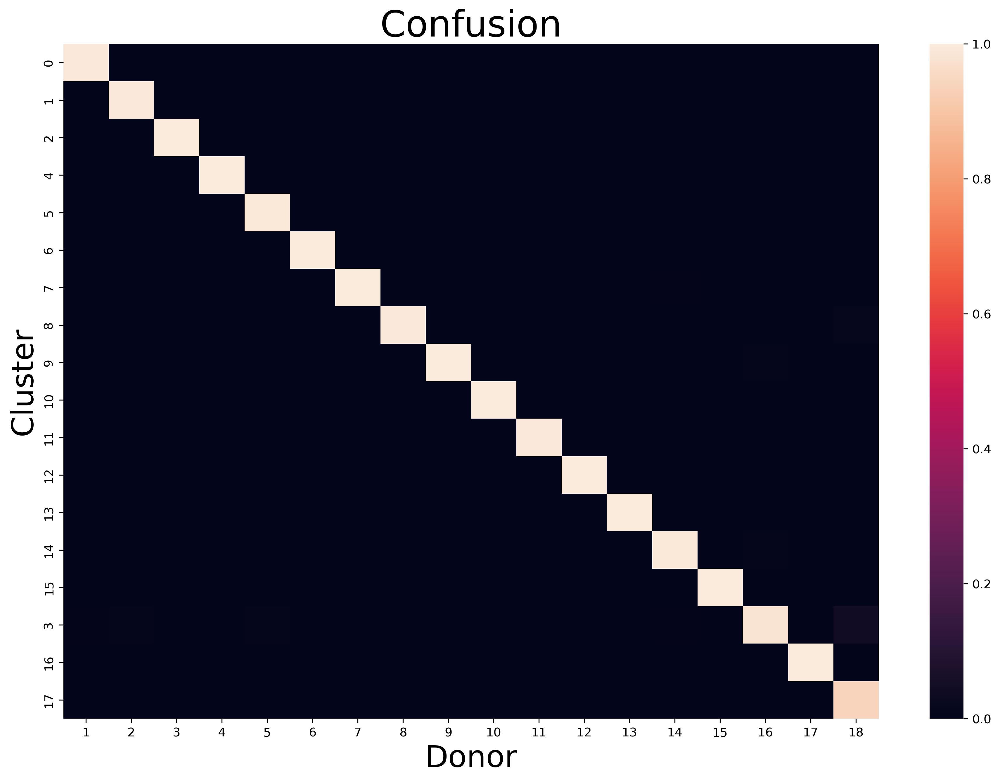

In [9]:
df_vireo_yes = np.genfromtxt('/home/u3570318/mount2/figures_final2/data/neuronDiff/id_vireo_yes.csv', delimiter = ',')[test1.cell_filter]
doublet_vireo_yes = np.genfromtxt('/home/u3570318/mount2/figures_final2/data/neuronDiff/doublet_vireo_yes.csv', delimiter = ',')[test1.cell_filter]
df_vireo_yes[doublet_vireo_yes == 1] = 18

reference = df_vireo_yes.astype(int)
predict = test1.assigned_label
    
matrix = np.zeros((18, 18))
ref_sum = np.zeros(18)

for q in range(sum(test1.cell_filter)):
    
    if reference[q] <= 17:

        matrix[reference[q], predict[q]] += 1
        ref_sum[reference[q]] += 1

prop = matrix / np.outer(ref_sum, np.ones(max(predict) + 1))

fig, ax = plt.subplots(1, 1)
fig.set_size_inches(15, 10)
ax = sns.heatmap(prop[:, [0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 3, 16, 17]].T, xticklabels = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18], yticklabels = [0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 3, 16, 17])
ax.set_ylabel("Cluster", fontsize = 25)
ax.set_xlabel("Donor", fontsize = 25)
ax.set_title("Confusion", fontsize = 30)
plt.gcf().set_dpi(300)
plt.show()

In [10]:
np.mean(np.max(prop, 1))

0.9925793655000166

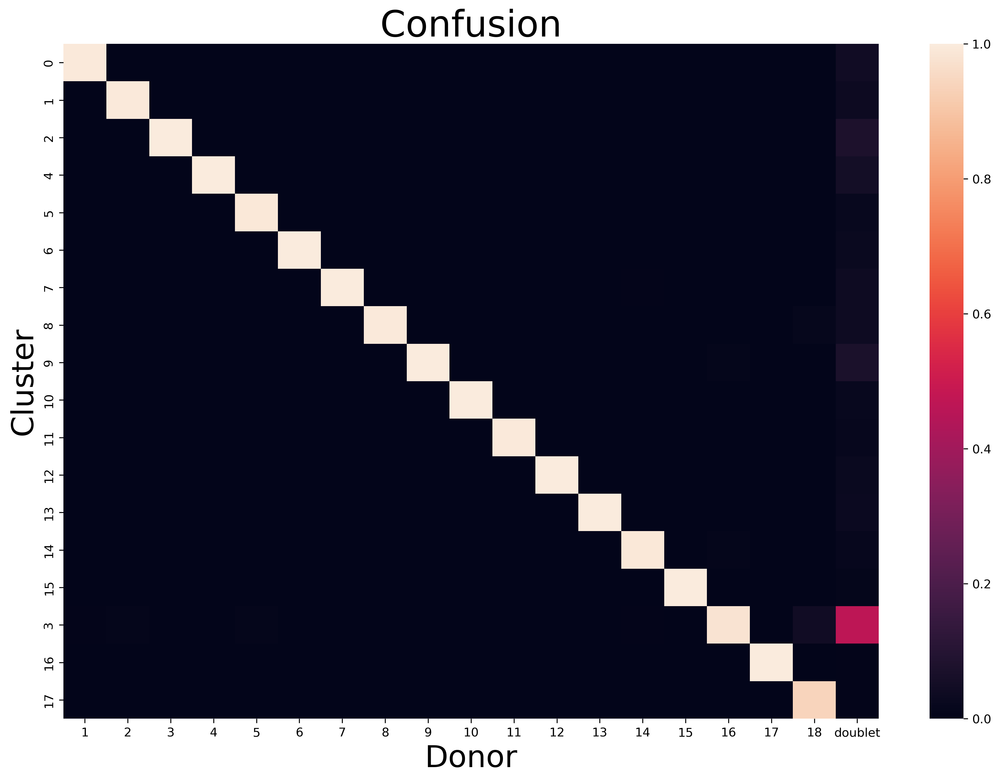

In [24]:
reference = df_vireo_yes.astype(int)
predict = test1.assigned_label
    
matrix = np.zeros((19, 18))
ref_sum = np.zeros(19)

for q in range(sum(test1.cell_filter)):

        matrix[reference[q], predict[q]] += 1
        ref_sum[reference[q]] += 1

prop = matrix / np.outer(ref_sum, np.ones(18))

fig, ax = plt.subplots(1, 1)
fig.set_size_inches(15, 10)
ax = sns.heatmap(prop[:, [0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 3, 16, 17]].T, xticklabels = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 'doublet'], yticklabels = [0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 3, 16, 17])
ax.set_ylabel("Cluster", fontsize = 25)
ax.set_xlabel("Donor", fontsize = 25)
ax.set_title("Confusion", fontsize = 30)
plt.gcf().set_dpi(300)
plt.show()

In [25]:
np.mean(np.max(prop[:-1, :][:, :-1], 1))

0.9428281217189222

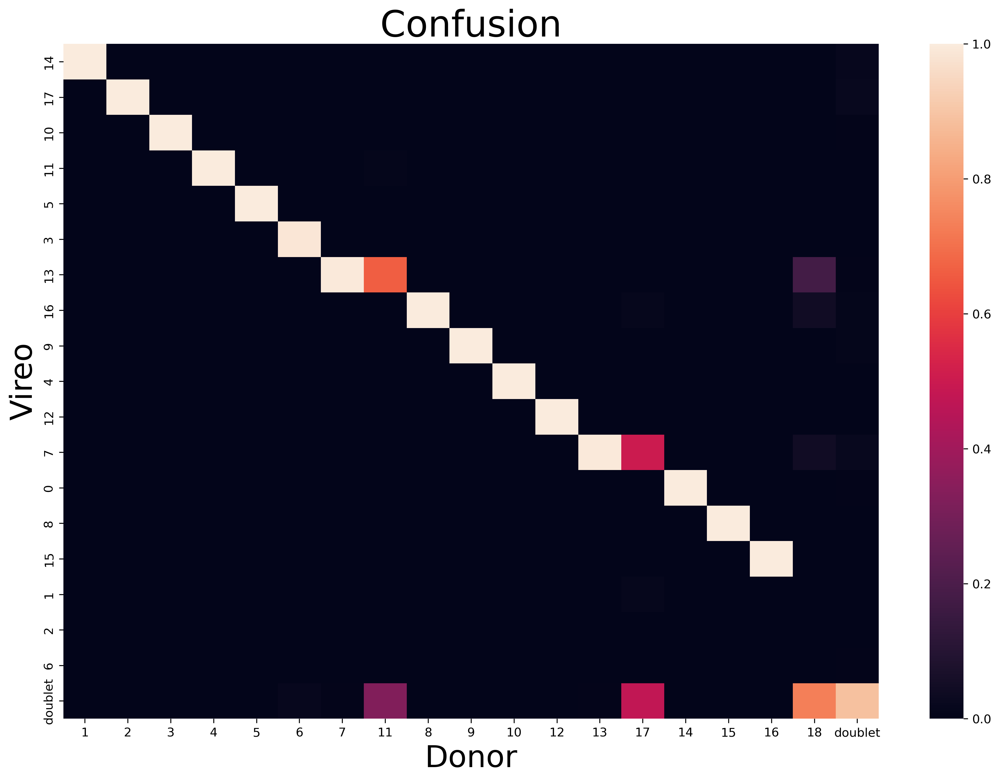

In [71]:
df_vireo_no = np.genfromtxt('/home/u3570318/mount2/figures_final2/data/neuronDiff/id_vireo_no.csv', delimiter = ',')[test1.cell_filter]
doublet_vireo_no = np.genfromtxt('/home/u3570318/mount2/figures_final2/data/neuronDiff/doublet_vireo_no.csv', delimiter = ',')[test1.cell_filter]
df_vireo_no[doublet_vireo_no == 1] = 18

reference = df_vireo_yes.astype(int)
predict = df_vireo_no.astype(int)
    
matrix = np.zeros((19, 19))
ref_sum = np.zeros(19)

for q in range(sum(test1.cell_filter)):

        matrix[reference[q], predict[q]] += 1
        ref_sum[reference[q]] += 1

prop = matrix / np.outer(ref_sum, np.ones(19))

fig, ax = plt.subplots(1, 1)
fig.set_size_inches(15, 10)
ax = sns.heatmap(prop[:, [14, 17, 10, 11, 5, 3, 13, 16, 9, 4, 12, 7, 0, 8, 15, 1, 2, 6, 18]][[0, 1, 2, 3, 4, 5, 6, 10, 7, 8, 9, 11, 12, 16, 13, 14, 15, 17, 18], :].T, xticklabels = [1, 2, 3, 4, 5, 6, 7, 11, 8, 9, 10, 12, 13, 17, 14, 15, 16, 18, 'doublet'], yticklabels = [14, 17, 10, 11, 5, 3, 13, 16, 9, 4, 12, 7, 0, 8, 15, 1, 2, 6, 'doublet'])
ax.set_ylabel("Vireo", fontsize = 25)
ax.set_xlabel("Donor", fontsize = 25)
ax.set_title("Confusion", fontsize = 30)
plt.gcf().set_dpi(300)
plt.show()

In [42]:
np.mean(np.max(prop[:-1, :][:, :-1], 1))

0.9058675093326563

In [43]:
np.mean(np.max(prop, 1))

0.9339737792504328

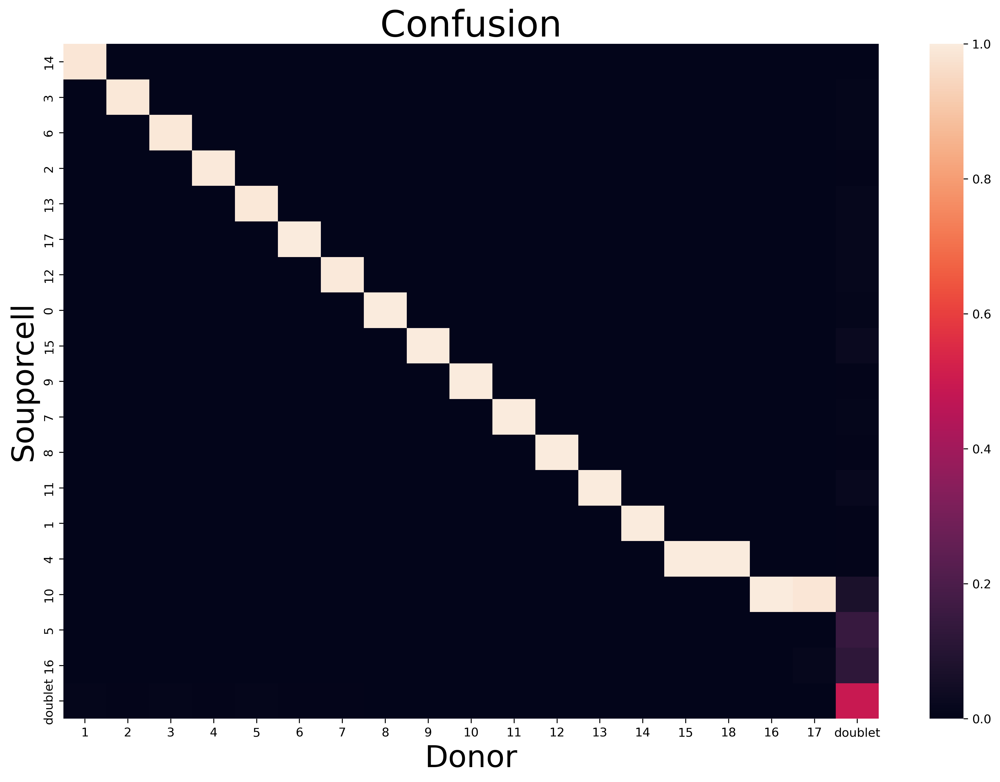

In [49]:
reference = df_vireo_yes.astype(int)
predict = df_souporcell.astype(int)
    
matrix = np.zeros((19, 19))
ref_sum = np.zeros(19)

for q in range(sum(test1.cell_filter)):

        matrix[reference[q], predict[q]] += 1
        ref_sum[reference[q]] += 1

prop = matrix / np.outer(ref_sum, np.ones(19))

fig, ax = plt.subplots(1, 1)
fig.set_size_inches(15, 10)
ax = sns.heatmap(prop[:, [14, 3, 6, 2, 13, 17, 12, 0, 15, 9, 7, 8, 11, 1, 4, 10, 5, 16, 18]][[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 17, 15, 16, 18], :].T, xticklabels = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 18, 16, 17, 'doublet'], yticklabels = [14, 3, 6, 2, 13, 17, 12, 0, 15, 9, 7, 8, 11, 1, 4, 10, 5, 16, 'doublet'])
ax.set_ylabel("Souporcell", fontsize = 25)
ax.set_xlabel("Donor", fontsize = 25)
ax.set_title("Confusion", fontsize = 30)
plt.gcf().set_dpi(300)
plt.show()

In [45]:
np.mean(np.max(prop[:-1, :][:, :-1], 1))

0.9962337448674621

In [46]:
np.mean(np.max(prop, 1))

0.9698395350435366

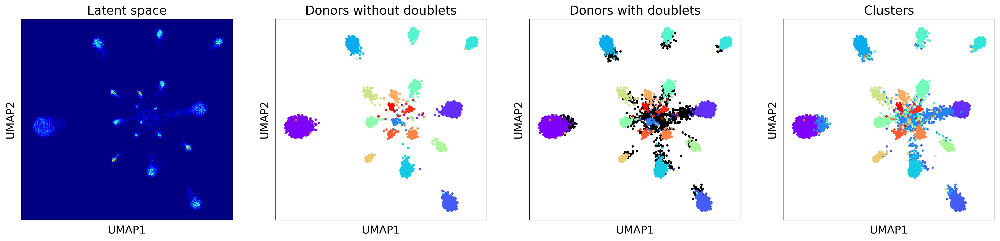

In [52]:
donors_vireo_yes = []

for h in range(19):
    
    donors_vireo_yes.append(np.where(df_vireo_yes == h)[0])
    
donors_vireo_no = []

for h in range(19):
    
    donors_vireo_no.append(np.where(df_vireo_no == h)[0])
    
donors_souporcell = []

for h in range(19):
    
    donors_souporcell.append(np.where(df_souporcell == h)[0])  

fig, axs = plt.subplots(1, 4, dpi = 300)
fig.set_size_inches(24, 5)

colors = cm.rainbow(np.linspace(0, 1, 18))

axs[1].set_title("Donors without doublets", fontsize = 17)

for w in range(18):
    
    axs[1].scatter(test1.embedding_2d[donors_vireo_yes[w], 0], test1.embedding_2d[donors_vireo_yes[w], 1], s = 5, color = colors[[0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 3, 16, 17][w]])
    
axs[1].set_xticks([])
axs[1].set_yticks([])
axs[1].set_xlabel("UMAP1", fontsize = 15)
axs[1].set_ylabel("UMAP2", fontsize = 15)

xlim0 = axs[1].get_xlim()
ylim0 = axs[1].get_ylim()

axs[2].set_title("Donors with doublets", fontsize = 17)

axs[2].scatter(test1.embedding_2d[donors_vireo_yes[18], 0], test1.embedding_2d[donors_vireo_yes[18], 1], s = 5, color = "black")

for w in range(18):
    
    axs[2].scatter(test1.embedding_2d[donors_vireo_yes[w], 0], test1.embedding_2d[donors_vireo_yes[w], 1], s = 5, color = colors[[0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 3, 16, 17][w]])
    
axs[2].set_xticks([])
axs[2].set_yticks([])
axs[2].set_xlabel("UMAP1", fontsize = 15)
axs[2].set_ylabel("UMAP2", fontsize = 15)
axs[2].set_xlim(xlim0)
axs[2].set_ylim(ylim0)

axs[0].hist2d(test1.embedding_2d[:, 0], test1.embedding_2d[:, 1], bins = (200, 200), cmap = plt.cm.jet, range = np.array([xlim0, ylim0]))
axs[0].set_xticks([])
axs[0].set_yticks([])
axs[0].set_title("Latent space", fontsize = 17)
axs[0].set_xlabel("UMAP1", fontsize = 15)
axs[0].set_ylabel("UMAP2", fontsize = 15)

axs[3].set_title("Clusters", fontsize = 17)

for w in range(18):
    
    axs[3].scatter(test1.embedding_2d[test1.clusters[w], 0], test1.embedding_2d[test1.clusters[w], 1], s = 5, color = test1.colors[w])
    
axs[3].set_xticks([])
axs[3].set_yticks([])
axs[3].set_xlabel("UMAP1", fontsize = 15)
axs[3].set_ylabel("UMAP2", fontsize = 15)

plt.show()

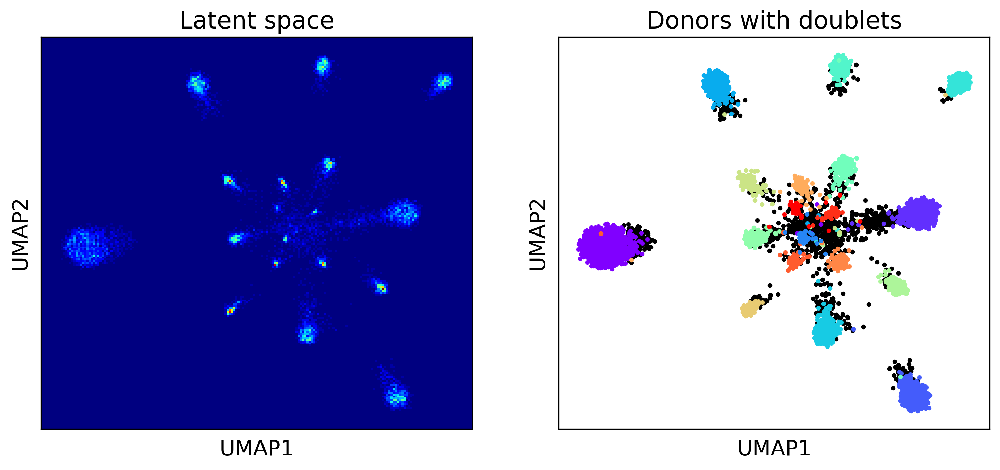

In [60]:
fig, axs = plt.subplots(1, 2, dpi = 300)
fig.set_size_inches(12, 5)

colors = cm.rainbow(np.linspace(0, 1, 18))

axs[1].set_title("Donors with doublets", fontsize = 17)

axs[1].scatter(test1.embedding_2d[donors_vireo_yes[18], 0], test1.embedding_2d[donors_vireo_yes[18], 1], s = 5, color = "black")

for w in range(18):
    
    axs[1].scatter(test1.embedding_2d[donors_vireo_yes[w], 0], test1.embedding_2d[donors_vireo_yes[w], 1], s = 5, color = colors[[0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 3, 16, 17][w]])
    
axs[1].set_xticks([])
axs[1].set_yticks([])
axs[1].set_xlabel("UMAP1", fontsize = 15)
axs[1].set_ylabel("UMAP2", fontsize = 15)
axs[1].set_xlim(xlim0)
axs[1].set_ylim(ylim0)

H_embedding_2d = axs[0].hist2d(test1.embedding_2d[:, 0], test1.embedding_2d[:, 1], bins = (200, 200), cmap = plt.cm.jet, range = np.array([test1.xlim_embedding_2d, test1.ylim_embedding_2d]), vmin = test1.vmin_embedding_2d, vmax = test1.vmax_embedding_2d)
axs[0].set_xticks([])
axs[0].set_yticks([])
axs[0].set_title("Latent space", fontsize = 17)
axs[0].set_xlabel("UMAP1", fontsize = 15)
axs[0].set_ylabel("UMAP2", fontsize = 15)
plt.show()

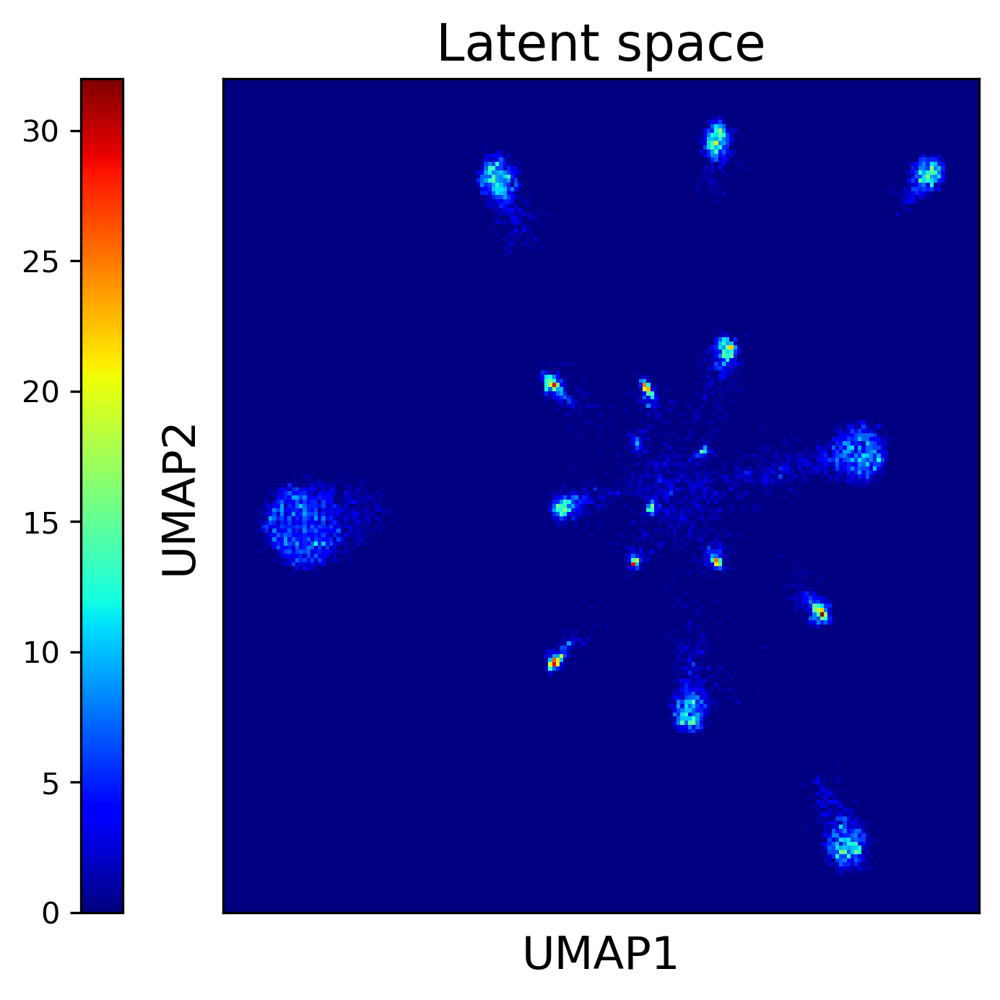

In [62]:
fig, axs = plt.subplots(1, 1, dpi = 300)
fig.set_size_inches(6, 5)

colors = cm.rainbow(np.linspace(0, 1, 18))

H_embedding_2d = axs.hist2d(test1.embedding_2d[:, 0], test1.embedding_2d[:, 1], bins = (200, 200), cmap = plt.cm.jet, range = np.array([test1.xlim_embedding_2d, test1.ylim_embedding_2d]), vmin = test1.vmin_embedding_2d, vmax = test1.vmax_embedding_2d)
axs.set_xticks([])
axs.set_yticks([])
axs.set_title("Latent space", fontsize = 17)
axs.set_xlabel("UMAP1", fontsize = 15)
axs.set_ylabel("UMAP2", fontsize = 15)
fig.colorbar(H_embedding_2d[3], ax = axs, location = "left")
plt.show()

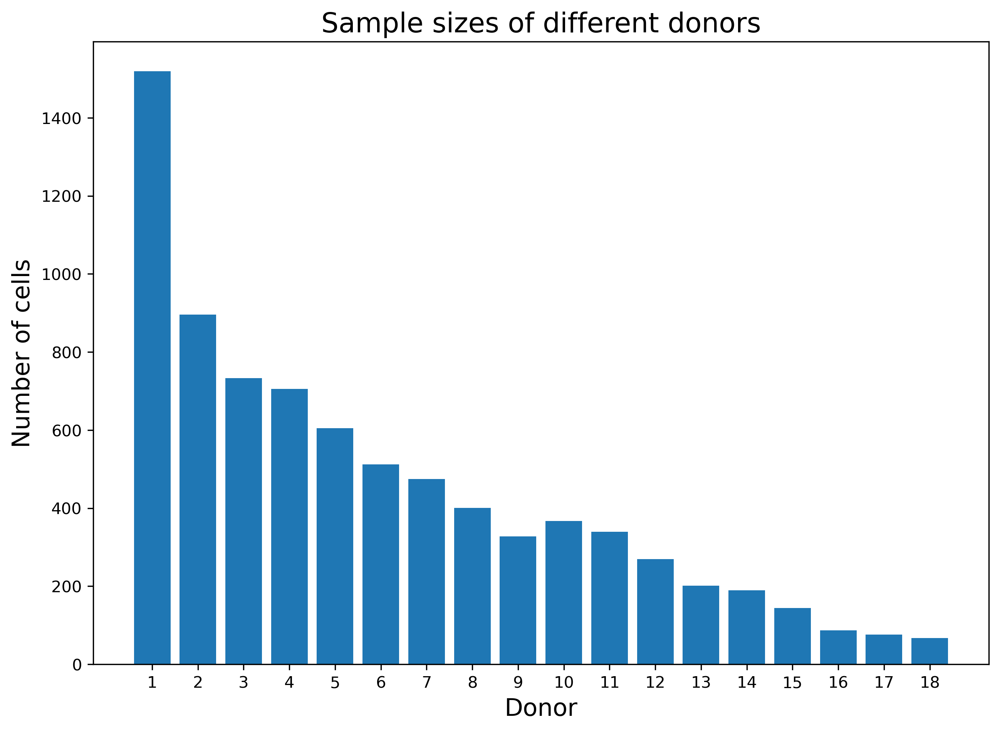

In [67]:
reference = df_vireo_yes.astype(int)
predict = test1.assigned_label
    
matrix = np.zeros((18, 18))
ref_sum = np.zeros(18)

for q in range(sum(test1.cell_filter)):
    
    if reference[q] <= 17:

        matrix[reference[q], predict[q]] += 1
        ref_sum[reference[q]] += 1

prop = matrix / np.outer(ref_sum, np.ones(max(predict) + 1))

plt.figure(dpi = 300, figsize = (10, 7))
plt.title("Sample sizes of different donors", fontsize = 17)
plt.xlabel("Donor", fontsize = 15)
plt.ylabel("Number of cells", fontsize = 15)
plt.bar(["1", "2", "3", "4", "5", "6", "7", "8", "9", "10", "11", "12", "13", "14", "15", "16", "17", "18"], ref_sum)
plt.show()

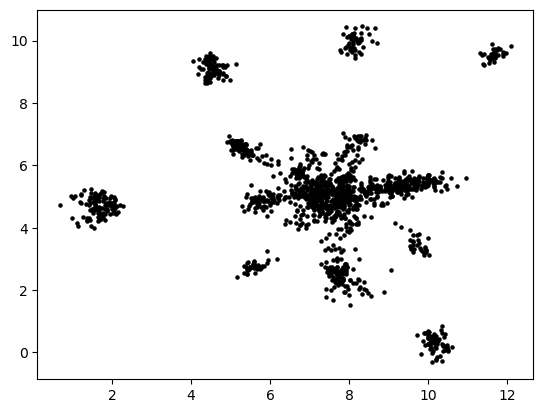

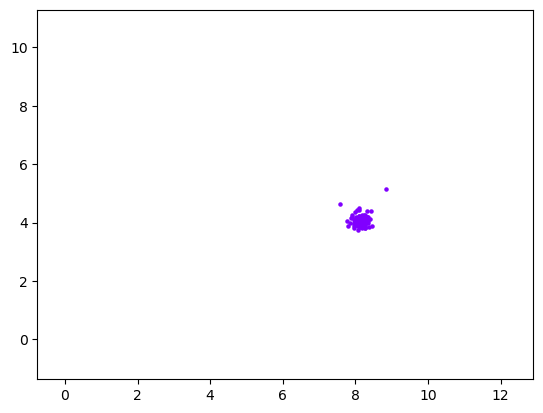

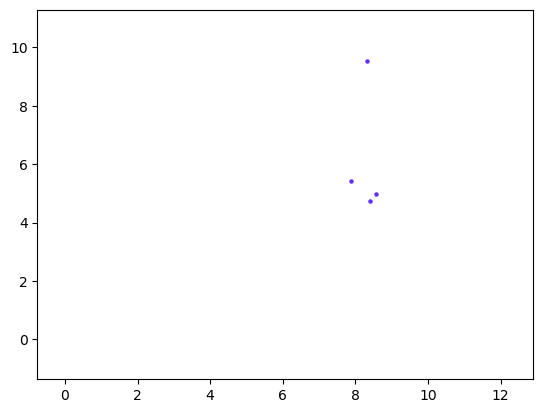

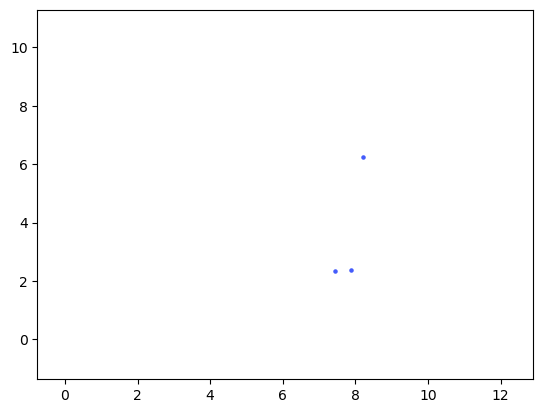

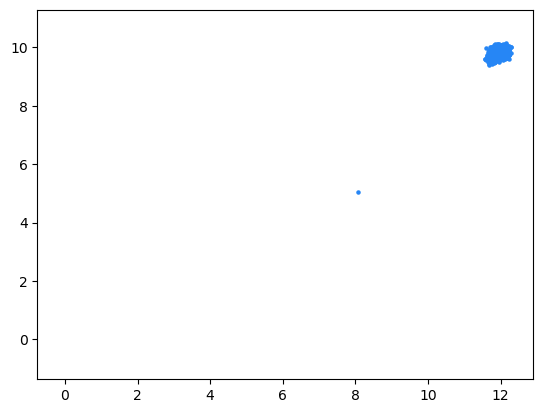

...

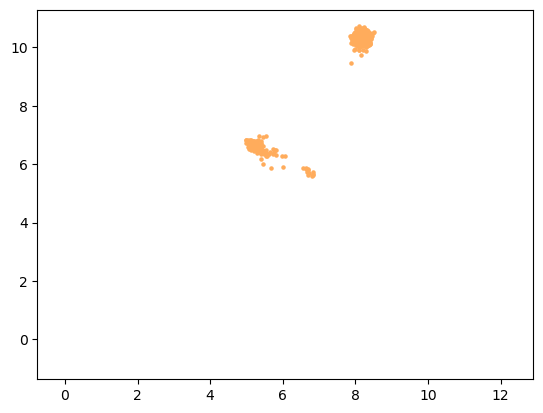

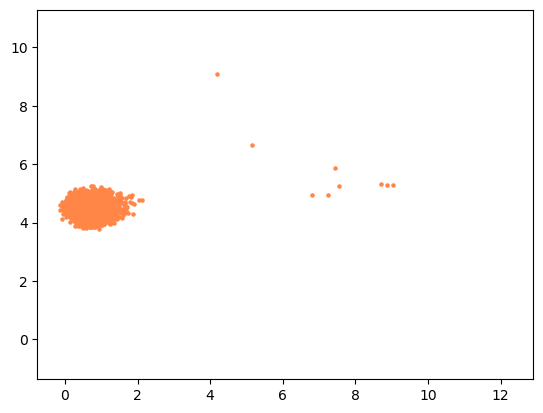

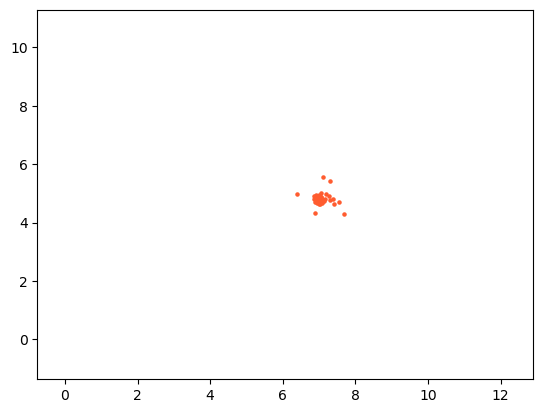

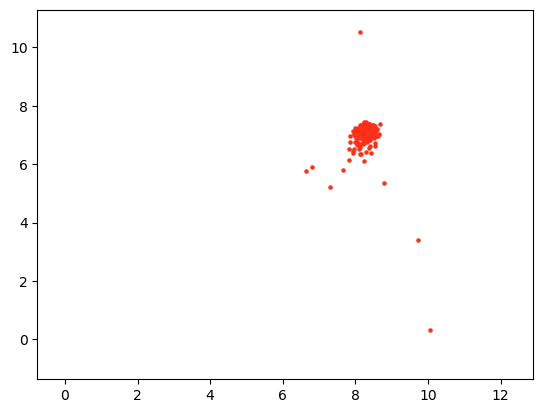

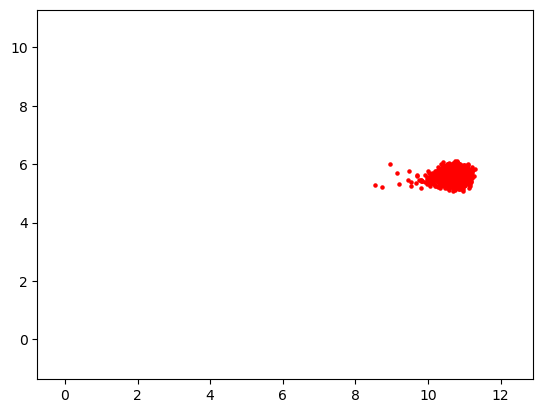

In [68]:
plt.scatter(test1.embedding_2d[donors_vireo_no[18], 0], test1.embedding_2d[donors_vireo_no[18], 1], s = 5, color = "black")
plt.show()

for w in range(18):
    
    plt.scatter(test1.embedding_2d[donors_vireo_no[w], 0], test1.embedding_2d[donors_vireo_no[w], 1], s = 5, color = colors[w])
    plt.xlim(test1.xlim_embedding_2d[0], test1.xlim_embedding_2d[1])
    plt.ylim(test1.ylim_embedding_2d[0], test1.ylim_embedding_2d[1])
    plt.show()

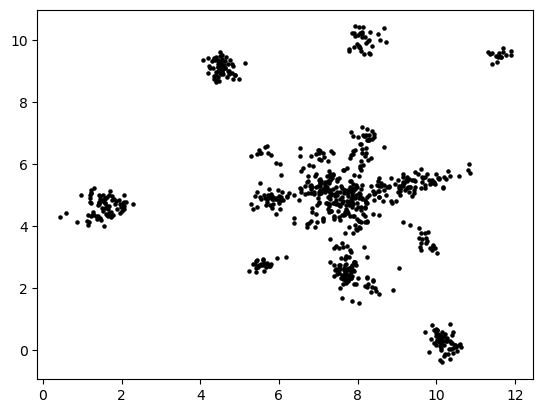

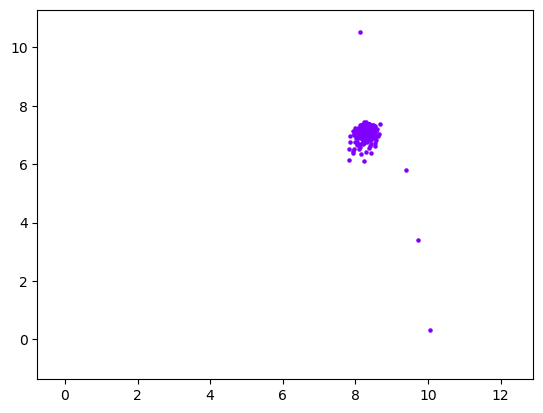

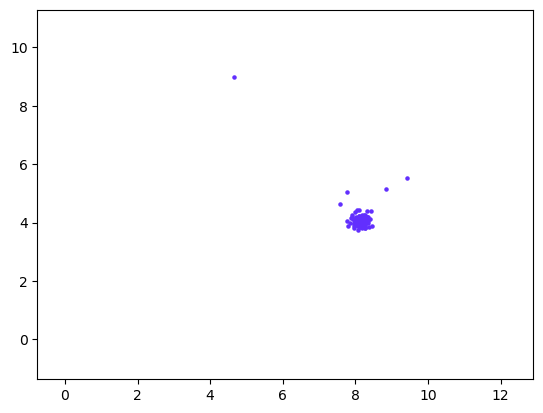

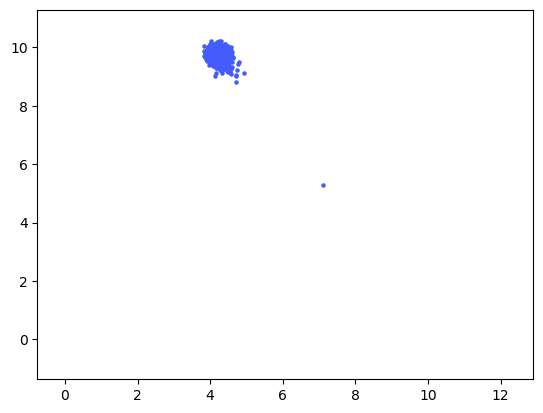

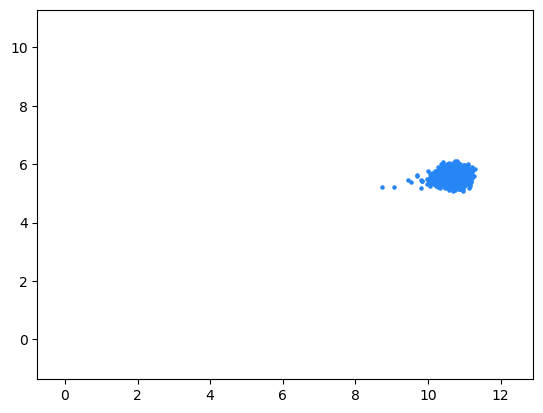

...

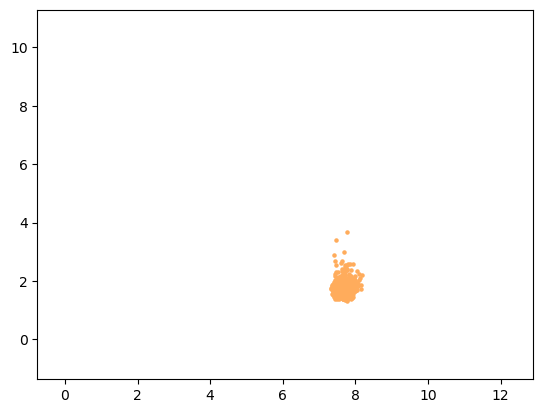

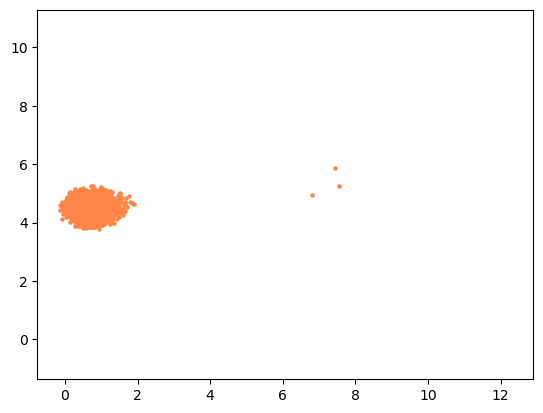

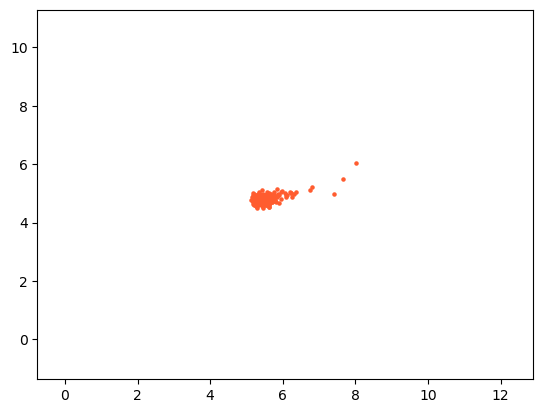

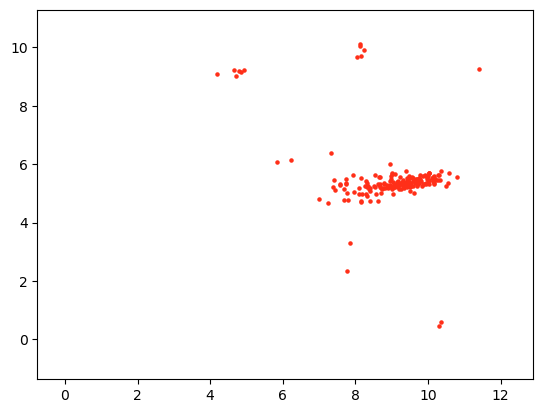

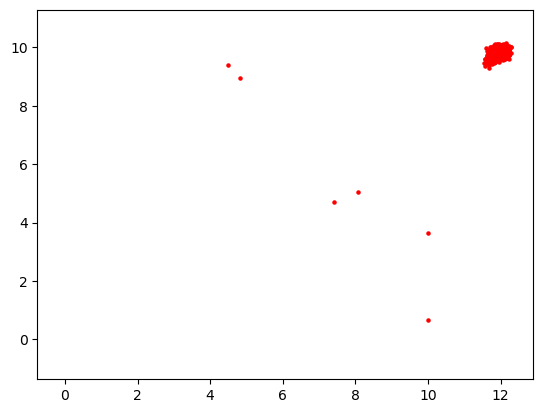

In [69]:
plt.scatter(test1.embedding_2d[donors_souporcell[18], 0], test1.embedding_2d[donors_souporcell[18], 1], s = 5, color = "black")
plt.show()

for w in range(18):
    
    plt.scatter(test1.embedding_2d[donors_souporcell[w], 0], test1.embedding_2d[donors_souporcell[w], 1], s = 5, color = colors[w])
    plt.xlim(test1.xlim_embedding_2d[0], test1.xlim_embedding_2d[1])
    plt.ylim(test1.ylim_embedding_2d[0], test1.ylim_embedding_2d[1])
    plt.show()

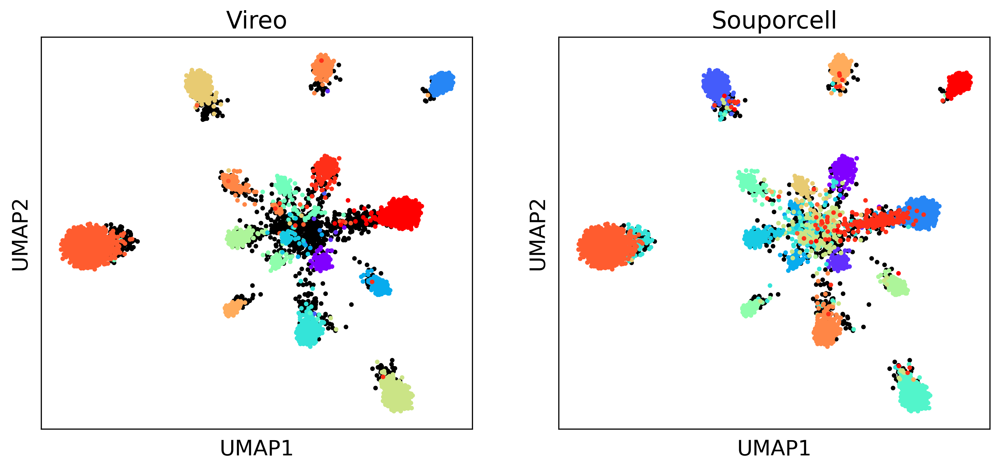

In [73]:
fig, axs = plt.subplots(1, 2, dpi = 300)
fig.set_size_inches(12, 5)

colors = cm.rainbow(np.linspace(0, 1, 18))

axs[0].set_title("Vireo", fontsize = 17)

axs[0].scatter(test1.embedding_2d[donors_vireo_no[18], 0], test1.embedding_2d[donors_vireo_no[18], 1], s = 5, color = "black")

for w in range(18):
    
    axs[0].scatter(test1.embedding_2d[donors_vireo_no[w], 0], test1.embedding_2d[donors_vireo_no[w], 1], s = 5, color = colors[[0, 1, 2, 3, 4, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 5, 16, 17][w]])
    
axs[0].set_xticks([])
axs[0].set_yticks([])
axs[0].set_xlabel("UMAP1", fontsize = 15)
axs[0].set_ylabel("UMAP2", fontsize = 15)

axs[1].set_title("Souporcell", fontsize = 17)

axs[1].scatter(test1.embedding_2d[donors_souporcell[18], 0], test1.embedding_2d[donors_souporcell[18], 1], s = 5, color = "black")

for w in range(18):
    
    axs[1].scatter(test1.embedding_2d[donors_souporcell[w], 0], test1.embedding_2d[donors_souporcell[w], 1], s = 5, color = colors[[0, 1, 2, 3, 4, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 5, 16, 17][w]])
    
axs[1].set_xticks([])
axs[1].set_yticks([])
axs[1].set_xlabel("UMAP1", fontsize = 15)
axs[1].set_ylabel("UMAP2", fontsize = 15)

plt.show()

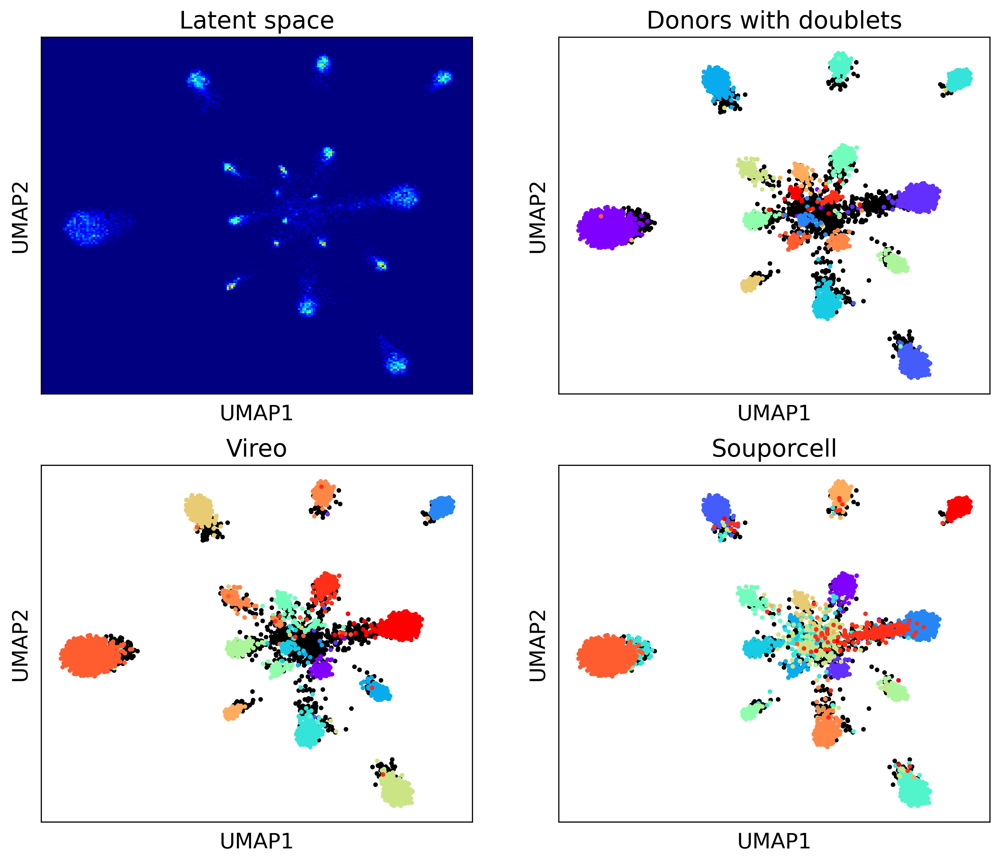

In [76]:
fig, axs = plt.subplots(2, 2, dpi = 300)
fig.set_size_inches(12, 10)

colors = cm.rainbow(np.linspace(0, 1, 18))

axs[0, 1].set_title("Donors with doublets", fontsize = 17)

axs[0, 1].scatter(test1.embedding_2d[donors_vireo_yes[18], 0], test1.embedding_2d[donors_vireo_yes[18], 1], s = 5, color = "black")

for w in range(18):
    
    axs[0, 1].scatter(test1.embedding_2d[donors_vireo_yes[w], 0], test1.embedding_2d[donors_vireo_yes[w], 1], s = 5, color = colors[[0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 3, 16, 17][w]])
    
axs[0, 1].set_xticks([])
axs[0, 1].set_yticks([])
axs[0, 1].set_xlabel("UMAP1", fontsize = 15)
axs[0, 1].set_ylabel("UMAP2", fontsize = 15)
axs[0, 1].set_xlim(xlim0)
axs[0, 1].set_ylim(ylim0)

H_embedding_2d = axs[0, 0].hist2d(test1.embedding_2d[:, 0], test1.embedding_2d[:, 1], bins = (200, 200), cmap = plt.cm.jet, range = np.array([test1.xlim_embedding_2d, test1.ylim_embedding_2d]), vmin = test1.vmin_embedding_2d, vmax = test1.vmax_embedding_2d)
axs[0, 0].set_xticks([])
axs[0, 0].set_yticks([])
axs[0, 0].set_title("Latent space", fontsize = 17)
axs[0, 0].set_xlabel("UMAP1", fontsize = 15)
axs[0, 0].set_ylabel("UMAP2", fontsize = 15)

axs[1, 0].set_title("Vireo", fontsize = 17)

axs[1, 0].scatter(test1.embedding_2d[donors_vireo_no[18], 0], test1.embedding_2d[donors_vireo_no[18], 1], s = 5, color = "black")

for w in range(18):
    
    axs[1, 0].scatter(test1.embedding_2d[donors_vireo_no[w], 0], test1.embedding_2d[donors_vireo_no[w], 1], s = 5, color = colors[[0, 1, 2, 3, 4, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 5, 16, 17][w]])
    
axs[1, 0].set_xticks([])
axs[1, 0].set_yticks([])
axs[1, 0].set_xlabel("UMAP1", fontsize = 15)
axs[1, 0].set_ylabel("UMAP2", fontsize = 15)

axs[1, 1].set_title("Souporcell", fontsize = 17)

axs[1, 1].scatter(test1.embedding_2d[donors_souporcell[18], 0], test1.embedding_2d[donors_souporcell[18], 1], s = 5, color = "black")

for w in range(18):
    
    axs[1, 1].scatter(test1.embedding_2d[donors_souporcell[w], 0], test1.embedding_2d[donors_souporcell[w], 1], s = 5, color = colors[[0, 1, 2, 3, 4, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 5, 16, 17][w]])
    
axs[1, 1].set_xticks([])
axs[1, 1].set_yticks([])
axs[1, 1].set_xlabel("UMAP1", fontsize = 15)
axs[1, 1].set_ylabel("UMAP2", fontsize = 15)

plt.show()

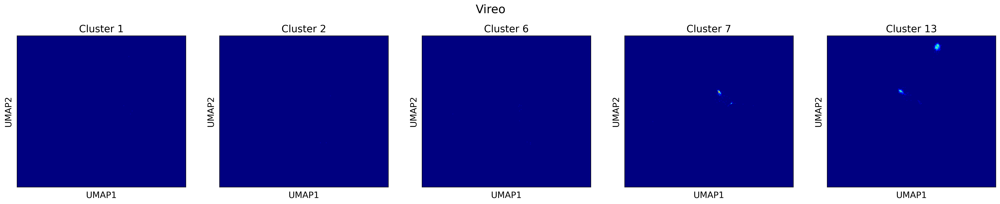

In [97]:
fig, axs = plt.subplots(1, 5, dpi = 300)
fig.set_size_inches(30, 5)
plt.suptitle("Vireo", fontsize = 20)
plt.subplots_adjust(top=0.83)

axs[0].hist2d(test1.embedding_2d[donors_vireo_no[1], 0], test1.embedding_2d[donors_vireo_no[1], 1], bins = (200, 200), cmap = plt.cm.jet, range = np.array([test1.xlim_embedding_2d, test1.ylim_embedding_2d]), vmin = test1.vmin_embedding_2d, vmax = test1.vmax_embedding_2d)
axs[0].set_title("Cluster 1", fontsize = 17)
axs[0].set_xticks([])
axs[0].set_yticks([])
axs[0].set_xlabel("UMAP1", fontsize = 15)
axs[0].set_ylabel("UMAP2", fontsize = 15)

axs[1].hist2d(test1.embedding_2d[donors_vireo_no[2], 0], test1.embedding_2d[donors_vireo_no[2], 1], bins = (200, 200), cmap = plt.cm.jet, range = np.array([test1.xlim_embedding_2d, test1.ylim_embedding_2d]), vmin = test1.vmin_embedding_2d, vmax = test1.vmax_embedding_2d)
axs[1].set_title("Cluster 2", fontsize = 17)
axs[1].set_xticks([])
axs[1].set_yticks([])
axs[1].set_xlabel("UMAP1", fontsize = 15)
axs[1].set_ylabel("UMAP2", fontsize = 15)

axs[2].hist2d(test1.embedding_2d[donors_vireo_no[6], 0], test1.embedding_2d[donors_vireo_no[6], 1], bins = (200, 200), cmap = plt.cm.jet, range = np.array([test1.xlim_embedding_2d, test1.ylim_embedding_2d]), vmin = test1.vmin_embedding_2d, vmax = test1.vmax_embedding_2d)
axs[2].set_title("Cluster 6", fontsize = 17)
axs[2].set_xticks([])
axs[2].set_yticks([])
axs[2].set_xlabel("UMAP1", fontsize = 15)
axs[2].set_ylabel("UMAP2", fontsize = 15)

axs[3].hist2d(test1.embedding_2d[donors_vireo_no[7], 0], test1.embedding_2d[donors_vireo_no[7], 1], bins = (200, 200), cmap = plt.cm.jet, range = np.array([test1.xlim_embedding_2d, test1.ylim_embedding_2d]), vmin = test1.vmin_embedding_2d, vmax = test1.vmax_embedding_2d)
axs[3].set_title("Cluster 7", fontsize = 17)
axs[3].set_xticks([])
axs[3].set_yticks([])
axs[3].set_xlabel("UMAP1", fontsize = 15)
axs[3].set_ylabel("UMAP2", fontsize = 15)

axs[4].hist2d(test1.embedding_2d[donors_vireo_no[13], 0], test1.embedding_2d[donors_vireo_no[13], 1], bins = (200, 200), cmap = plt.cm.jet, range = np.array([test1.xlim_embedding_2d, test1.ylim_embedding_2d]), vmin = test1.vmin_embedding_2d, vmax = test1.vmax_embedding_2d)
axs[4].set_title("Cluster 13", fontsize = 17)
axs[4].set_xticks([])
axs[4].set_yticks([])
axs[4].set_xlabel("UMAP1", fontsize = 15)
axs[4].set_ylabel("UMAP2", fontsize = 15)

plt.show()

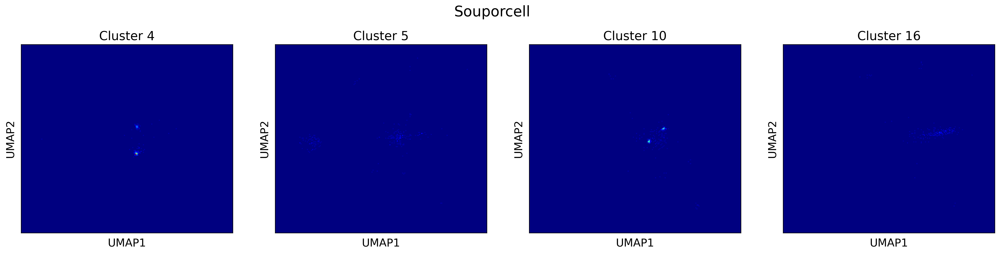

In [98]:
fig, axs = plt.subplots(1, 4, dpi = 300)
fig.set_size_inches(24, 5)
plt.suptitle("Souporcell", fontsize = 20)
plt.subplots_adjust(top=0.83)

axs[0].hist2d(test1.embedding_2d[donors_souporcell[4], 0], test1.embedding_2d[donors_souporcell[4], 1], bins = (200, 200), cmap = plt.cm.jet, range = np.array([test1.xlim_embedding_2d, test1.ylim_embedding_2d]), vmin = test1.vmin_embedding_2d, vmax = test1.vmax_embedding_2d)
axs[0].set_title("Cluster 4", fontsize = 17)
axs[0].set_xticks([])
axs[0].set_yticks([])
axs[0].set_xlabel("UMAP1", fontsize = 15)
axs[0].set_ylabel("UMAP2", fontsize = 15)

axs[1].hist2d(test1.embedding_2d[donors_souporcell[5], 0], test1.embedding_2d[donors_souporcell[5], 1], bins = (200, 200), cmap = plt.cm.jet, range = np.array([test1.xlim_embedding_2d, test1.ylim_embedding_2d]), vmin = test1.vmin_embedding_2d, vmax = test1.vmax_embedding_2d)
axs[1].set_title("Cluster 5", fontsize = 17)
axs[1].set_xticks([])
axs[1].set_yticks([])
axs[1].set_xlabel("UMAP1", fontsize = 15)
axs[1].set_ylabel("UMAP2", fontsize = 15)

axs[2].hist2d(test1.embedding_2d[donors_souporcell[10], 0], test1.embedding_2d[donors_souporcell[10], 1], bins = (200, 200), cmap = plt.cm.jet, range = np.array([test1.xlim_embedding_2d, test1.ylim_embedding_2d]), vmin = test1.vmin_embedding_2d, vmax = test1.vmax_embedding_2d)
axs[2].set_title("Cluster 10", fontsize = 17)
axs[2].set_xticks([])
axs[2].set_yticks([])
axs[2].set_xlabel("UMAP1", fontsize = 15)
axs[2].set_ylabel("UMAP2", fontsize = 15)

axs[3].hist2d(test1.embedding_2d[donors_souporcell[16], 0], test1.embedding_2d[donors_souporcell[16], 1], bins = (200, 200), cmap = plt.cm.jet, range = np.array([test1.xlim_embedding_2d, test1.ylim_embedding_2d]), vmin = test1.vmin_embedding_2d, vmax = test1.vmax_embedding_2d)
axs[3].set_title("Cluster 16", fontsize = 17)
axs[3].set_xticks([])
axs[3].set_yticks([])
axs[3].set_xlabel("UMAP1", fontsize = 15)
axs[3].set_ylabel("UMAP2", fontsize = 15)

plt.show()

In [20]:
np.savetxt("assigned_label.csv", test1.assigned_label, delimiter=",")
np.savetxt("embedding_2d.csv", test1.embedding_2d, delimiter=",")
np.savetxt("cell_filter.csv", test1.cell_filter, delimiter=",")
np.savetxt("SNP_filter.csv", test1.SNP_filter, delimiter=",")
np.savetxt("latent.csv", test1.latent, delimiter=",")

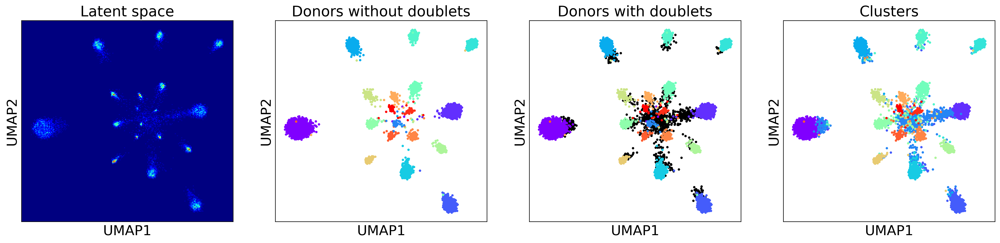

In [12]:
%run /home/kevin/storage_kevin/past_figures/figures_final8/notebook/SNPmanifold.ipynb

colors = cm.rainbow(np.linspace(0, 1, 18))

embedding_2d = np.genfromtxt("embedding_2d.csv", delimiter=",")
assigned_label = np.genfromtxt("assigned_label.csv", delimiter=",")
cell_filter = np.genfromtxt("cell_filter.csv", delimiter=",").astype(bool)

df_vireo_yes = np.genfromtxt('/home/kevin/storage_kevin/past_figures/figures_final8/data/donor18/id_vireo_yes.csv', delimiter = ',')[cell_filter]
doublet_vireo_yes = np.genfromtxt('/home/kevin/storage_kevin/past_figures/figures_final8/data/donor18/doublet_vireo_yes.csv', delimiter = ',')[cell_filter]
df_vireo_yes[doublet_vireo_yes == 1] = 18

clusters = []

for w in range(np.max(assigned_label).astype(int) + 1):
    
    clusters.append(np.where(assigned_label == w))

donors_vireo_yes = []

for h in range(19):
    
    donors_vireo_yes.append(np.where(df_vireo_yes == h)[0])

fig, axs = plt.subplots(1, 4, dpi = 300)
fig.set_size_inches(24, 5)

axs[1].set_title("Donors without doublets", fontsize = 20)

for w in range(18):
    
    axs[1].scatter(embedding_2d[donors_vireo_yes[w], 0], embedding_2d[donors_vireo_yes[w], 1], s = 5, color = colors[[0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 3, 16, 17][w]])
    
axs[1].set_xticks([])
axs[1].set_yticks([])
axs[1].set_xlabel("UMAP1", fontsize = 19)
axs[1].set_ylabel("UMAP2", fontsize = 19)

xlim0 = axs[1].get_xlim()
ylim0 = axs[1].get_ylim()

axs[2].set_title("Donors with doublets", fontsize = 20)

axs[2].scatter(embedding_2d[donors_vireo_yes[18], 0], embedding_2d[donors_vireo_yes[18], 1], s = 5, color = "black")

for w in range(18):
    
    axs[2].scatter(embedding_2d[donors_vireo_yes[w], 0], embedding_2d[donors_vireo_yes[w], 1], s = 5, color = colors[[0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 3, 16, 17][w]])
    
axs[2].set_xticks([])
axs[2].set_yticks([])
axs[2].set_xlabel("UMAP1", fontsize = 19)
axs[2].set_ylabel("UMAP2", fontsize = 19)
axs[2].set_xlim(xlim0)
axs[2].set_ylim(ylim0)

axs[0].hist2d(embedding_2d[:, 0], embedding_2d[:, 1], bins = (200, 200), cmap = plt.cm.jet, range = np.array([xlim0, ylim0]))
axs[0].set_xticks([])
axs[0].set_yticks([])
axs[0].set_title("Latent space", fontsize = 20)
axs[0].set_xlabel("UMAP1", fontsize = 19)
axs[0].set_ylabel("UMAP2", fontsize = 19)

axs[3].set_title("Clusters", fontsize = 20)

for w in range(18):
    
    axs[3].scatter(embedding_2d[clusters[w], 0], embedding_2d[clusters[w], 1], s = 5, color = colors[w])
    
axs[3].set_xticks([])
axs[3].set_yticks([])
axs[3].set_xlabel("UMAP1", fontsize = 19)
axs[3].set_ylabel("UMAP2", fontsize = 19)

plt.show()

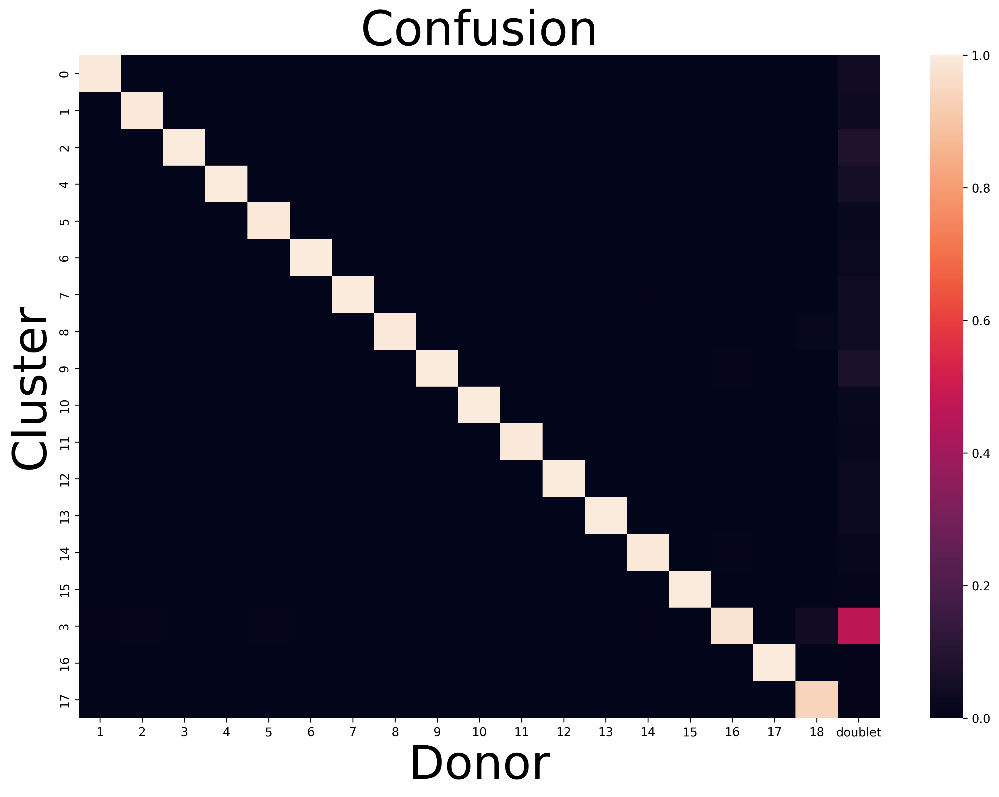

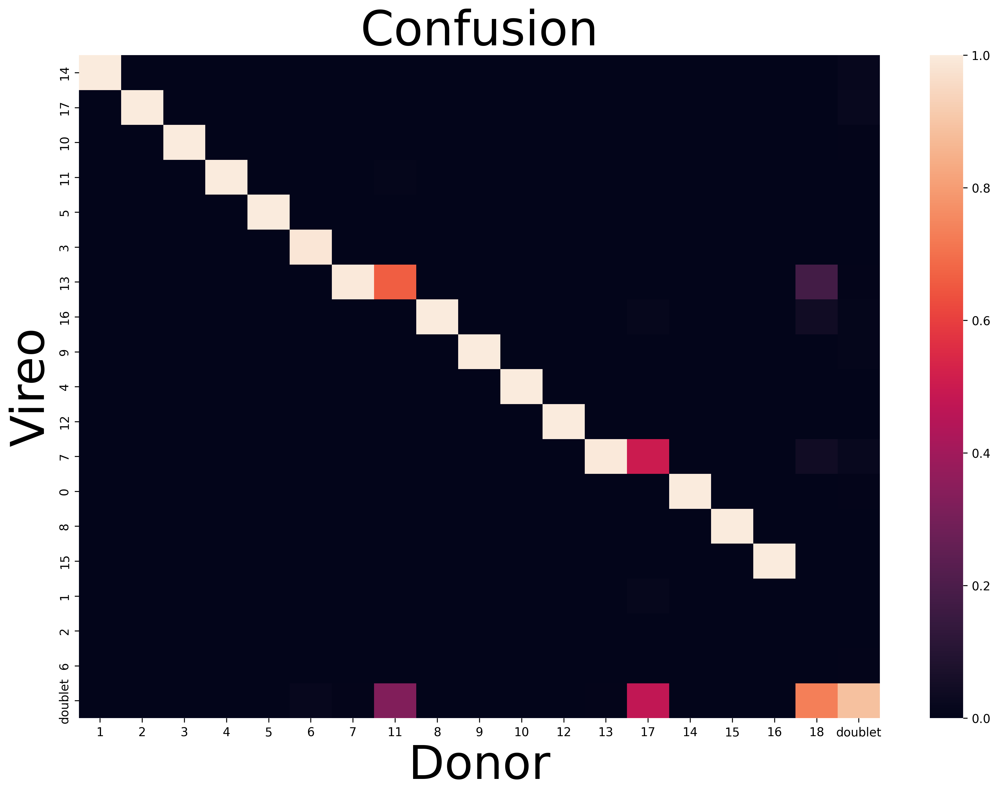

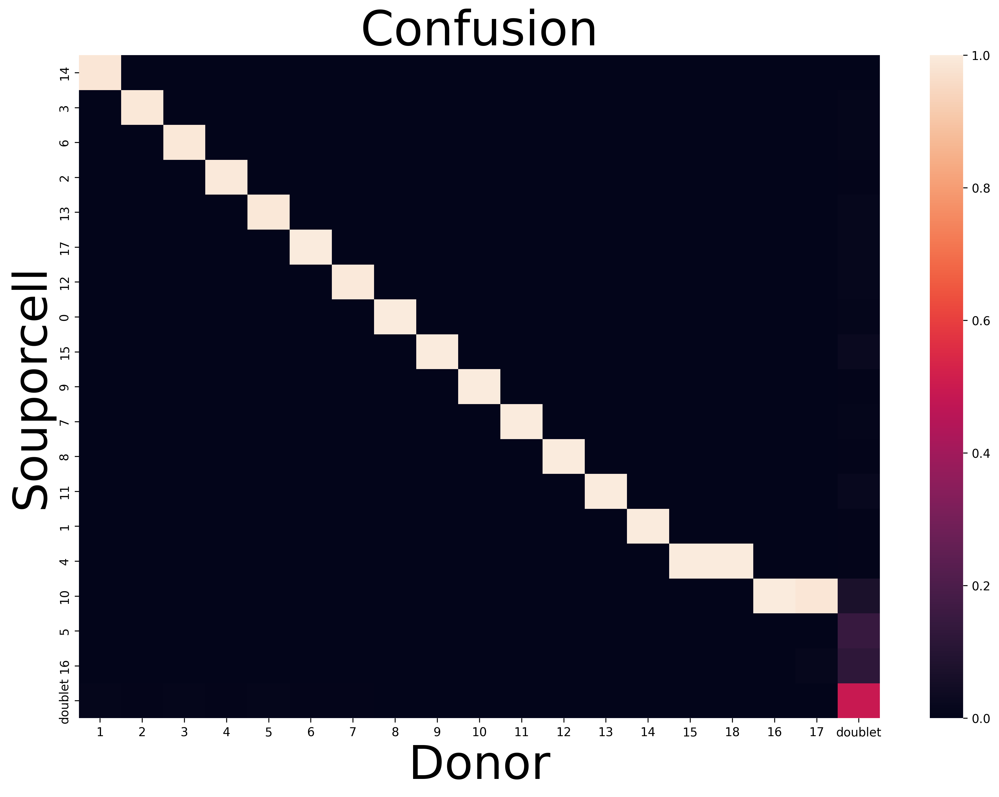

In [15]:
df_vireo_yes = np.genfromtxt('/home/kevin/storage_kevin/past_figures/figures_final8/data/donor18/id_vireo_yes.csv', delimiter = ',')[cell_filter]
doublet_vireo_yes = np.genfromtxt('/home/kevin/storage_kevin/past_figures/figures_final8/data/donor18/doublet_vireo_yes.csv', delimiter = ',')[cell_filter]
df_vireo_yes[doublet_vireo_yes == 1] = 18

df_vireo_no = np.genfromtxt('/home/kevin/storage_kevin/past_figures/figures_final8/data/donor18/id_vireo_no.csv', delimiter = ',')[cell_filter]
doublet_vireo_no = np.genfromtxt('/home/kevin/storage_kevin/past_figures/figures_final8/data/donor18/doublet_vireo_no.csv', delimiter = ',')[cell_filter]
df_vireo_no[doublet_vireo_no == 1] = 18

tsv_souporcell = pd.read_csv('/home/kevin/storage_kevin/past_figures/figures_final8/data/donor18/clusters_souporcell.tsv', sep='\t')

souporcell_prob = np.zeros((18, 9612))

for w in range(18):
 
    souporcell_prob[w, :] = tsv_souporcell["cluster" + str(w)].to_numpy()
    
df_souporcell = np.argmax(souporcell_prob, 0)

doublet_souporcell = tsv_souporcell["status"].to_numpy() == "doublet"

df_souporcell[doublet_souporcell] = 18

df_souporcell = df_souporcell[cell_filter]

reference = df_vireo_yes.astype(int)
predict = assigned_label.astype(int)
    
matrix = np.zeros((19, 18))
ref_sum = np.zeros(19)

for q in range(sum(cell_filter)):

        matrix[reference[q], predict[q]] += 1
        ref_sum[reference[q]] += 1

prop = matrix / np.outer(ref_sum, np.ones(18))

fig, ax = plt.subplots(1, 1)
fig.set_size_inches(15, 10)
ax = sns.heatmap(prop[:, [0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 3, 16, 17]].T, xticklabels = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 'doublet'], yticklabels = [0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 3, 16, 17])
ax.set_ylabel("Cluster", fontsize = 39)
ax.set_xlabel("Donor", fontsize = 39)
ax.set_title("Confusion", fontsize = 40)
plt.gcf().set_dpi(300)
plt.show()

reference = df_vireo_yes.astype(int)
predict = df_vireo_no.astype(int)
    
matrix = np.zeros((19, 19))
ref_sum = np.zeros(19)

for q in range(sum(cell_filter)):

        matrix[reference[q], predict[q]] += 1
        ref_sum[reference[q]] += 1

prop = matrix / np.outer(ref_sum, np.ones(19))

fig, ax = plt.subplots(1, 1)
fig.set_size_inches(15, 10)
ax = sns.heatmap(prop[:, [14, 17, 10, 11, 5, 3, 13, 16, 9, 4, 12, 7, 0, 8, 15, 1, 2, 6, 18]][[0, 1, 2, 3, 4, 5, 6, 10, 7, 8, 9, 11, 12, 16, 13, 14, 15, 17, 18], :].T, xticklabels = [1, 2, 3, 4, 5, 6, 7, 11, 8, 9, 10, 12, 13, 17, 14, 15, 16, 18, 'doublet'], yticklabels = [14, 17, 10, 11, 5, 3, 13, 16, 9, 4, 12, 7, 0, 8, 15, 1, 2, 6, 'doublet'])
ax.set_ylabel("Vireo", fontsize = 39)
ax.set_xlabel("Donor", fontsize = 39)
ax.set_title("Confusion", fontsize = 40)
plt.gcf().set_dpi(300)
plt.show()

reference = df_vireo_yes.astype(int)
predict = df_souporcell.astype(int)
    
matrix = np.zeros((19, 19))
ref_sum = np.zeros(19)

for q in range(sum(cell_filter)):

        matrix[reference[q], predict[q]] += 1
        ref_sum[reference[q]] += 1

prop = matrix / np.outer(ref_sum, np.ones(19))

fig, ax = plt.subplots(1, 1)
fig.set_size_inches(15, 10)
ax = sns.heatmap(prop[:, [14, 3, 6, 2, 13, 17, 12, 0, 15, 9, 7, 8, 11, 1, 4, 10, 5, 16, 18]][[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 17, 15, 16, 18], :].T, xticklabels = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 18, 16, 17, 'doublet'], yticklabels = [14, 3, 6, 2, 13, 17, 12, 0, 15, 9, 7, 8, 11, 1, 4, 10, 5, 16, 'doublet'])
ax.set_ylabel("Souporcell", fontsize = 39)
ax.set_xlabel("Donor", fontsize = 39)
ax.set_title("Confusion", fontsize = 40)
plt.gcf().set_dpi(300)
plt.show()